## S380 Homework Problems
### Ramzi Kattan

### Libraries

In [346]:
# Libraries
%reset -f
import pandas as pd
import matplotlib.pyplot as plt
import torchvision
from torchvision import transforms
from torchvision.datasets import ImageFolder
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader, TensorDataset, random_split
import numpy as np
import torch.nn.functional as F
from sklearn.metrics import confusion_matrix
import seaborn as sns
import plotly.express as px 
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import os 
import nltk
from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords
from sklearn.feature_extraction.text import CountVectorizer
import string
from nltk.stem import PorterStemmer
import gensim
from gensim import corpora
from sklearn.feature_extraction.text import TfidfVectorizer
from gensim.models import Phrases
from gensim.matutils import Sparse2Corpus
from collections import defaultdict
from gensim.models.phrases import Phraser
import torch
from sklearn.preprocessing import LabelEncoder
from sklearn.cluster import KMeans
from mlxtend.preprocessing import TransactionEncoder
from mlxtend.frequent_patterns import apriori
from mlxtend.frequent_patterns import association_rules
import networkx as nx

# 1. Probability Practice

#### Part A
**Visitors to your website are asked to answer a single survey question before they get access to the content on the page. Among all of the users, there are two categories: Random Clicker (RC), and Truthful Clicker (TC). There are two possible answers to the survey: yes and no. Random clickers would click either one with equal probability. You are also giving the information that the expected fraction of random clickers is 0.3. After a trial period, you get the following survey results: 65% said Yes and 35% said No. What fraction of people who are truthful clickers answered yes? Hint: use the rule of total probability.**

Clicker: p(R) = 30%, p(T) = 70%

Random Clickers: p(Y|R) = 50%, p(N|R) = 50%

Trial Results: p(Y) = 65%, p(N) = 35%

$$
p(Y) = p(Y|T)p(T) + p(Y|R)p(R)
$$
Rearrange to get: 
$$
p(Y|T) = \frac{p(Y) - p(Y|R)p(R)}{p(T)} = \frac{0.65 - 0.5*0.3}{0.7} = 71.43\%
$$
The probability that someone clicked yes given that they are a truthful clicker is about 71.43%.

#### Part B
**Imagine a medical test for a disease with the following two attributes:
The sensitivity is about 0.993. That is, if someone has the disease, there is a probability of 0.993 that they will test positive.
The specificity is about 0.9999. This means that if someone doesn't have the disease, there is probability of 0.9999 that they will test negative.
In the general population, incidence of the disease is reasonably rare: about 0.0025% of all people have it (or 0.000025 as a decimal probability).
Suppose someone tests positive. What is the probability that they have the disease?**

p(P|D) = 0.993

p(N|H) = 0.9999

p(D) = 0.000025

p(H) = 1 - 0.000025 = 0.999975

$$
p(D|P) = \frac{p(P \cap D)}{p(P)}
$$
but, 
$$
p(P \cap D) = p(P|D) * p(D) = 0.993 * 0.000025 = 2.4825 * 10^{-5}
$$
and, 
$$
P(P) = p(P|D)*p(D) + p(P|H)*p(H) = p(P|D)*p(D) + (1 - P(N|H))*p(H) = 2.4825 * 10^{-5} + (1 - 0.999)*0.999975 = 1.248225*10^{-4}
$$
so, 
$$
p(D|P) = \frac{p(P|D) * p(D)}{P(P)} = \frac{2.4825 * 10^{-5}}{0.0010248} = 0.1989
$$
Therefore, the probability that someone has the disease given that they tested positive is around 20%. 

# 2. Wrangling the Billboard Top 100

### Set-Up
Importing the data set and pulling only the columns needed for this problem. 

In [223]:
billboards = pd.read_csv("Billboard data.csv")
need = ['song', 'performer', 'year', 'week', 'week_position']
billboards = billboards.loc[:, need]
billboards.head()

,song,performer,year,week,week_position
0,Don't Just Stand There,Patty Duke,1965,29,34
1,Don't Just Stand There,Patty Duke,1965,30,22
2,Don't Just Stand There,Patty Duke,1965,31,14
3,Don't Just Stand There,Patty Duke,1965,32,10
4,Don't Just Stand There,Patty Duke,1965,33,8


### Part A
**Make a table of the top 10 most popular songs since 1958, as measured by the total number of weeks that a song spent on the Billboard Top 100. Note that these data end in week 22 of 2021, so the most popular songs of 2021 will not have up-to-the-minute data; please send our apologies to The Weeknd.
Your table should have 10 rows and 3 columns: performer, song, and count, where count represents the number of weeks that song appeared in the Billboard Top 100. Make sure the entries are sorted in descending order of the count variable, so that the more popular songs appear at the top of the table. Give your table a short caption describing what is shown in the table.
(Note: you'll want to use both performer and song in any group_by operations, to account for the fact that multiple unique songs can share the same title.)**

In [132]:
topsongs = (billboards.groupby(['performer', 'song'])['week']
          .agg('count')
          .reset_index()
          .set_index('performer')
          .sort_values(by = 'week', ascending = False)
          .rename(columns = {'week': 'count'}))
topstyled = top10[0:10].style.set_caption("Top 10 Songs by Number of Weeks on Billboard Top 100")
topstyled

,song,count
performer,,
Imagine Dragons,Radioactive,87
AWOLNATION,Sail,79
The Weeknd,Blinding Lights,76
Jason Mraz,I'm Yours,76
LeAnn Rimes,How Do I Live,69
OneRepublic,Counting Stars,68
LMFAO Featuring Lauren Bennett & GoonRock,Party Rock Anthem,68
Jewel,Foolish Games/You Were Meant For Me,65
Adele,Rolling In The Deep,65


### Part B
**Is the "musical diversity" of the Billboard Top 100 changing over time? Let's find out. We'll measure the musical diversity of given year as the number of unique songs that appeared in the Billboard Top 100 that year. Make a line graph that plots this measure of musical diversity over the years. The x axis should show the year, while the y axis should show the number of unique songs appearing at any position on the Billboard Top 100 chart in any week that year. For this part, please filter the data set so that it excludes the years 1958 and 2021, since we do not have complete data on either of those years. Give the figure an informative caption in which you explain what is shown in the figure and comment on any interesting trends you see.
There are number of ways to accomplish the data wrangling here. For example, you could use two distinct sets of data-wrangling steps. The first set of steps would get you a table that counts the number of times that a given song appears on the Top 100 in a given year. The second set of steps operate on the result of the first set of steps; it would count the number of unique songs that appeared on the Top 100 in each year, irrespective of how many times it had appeared.**

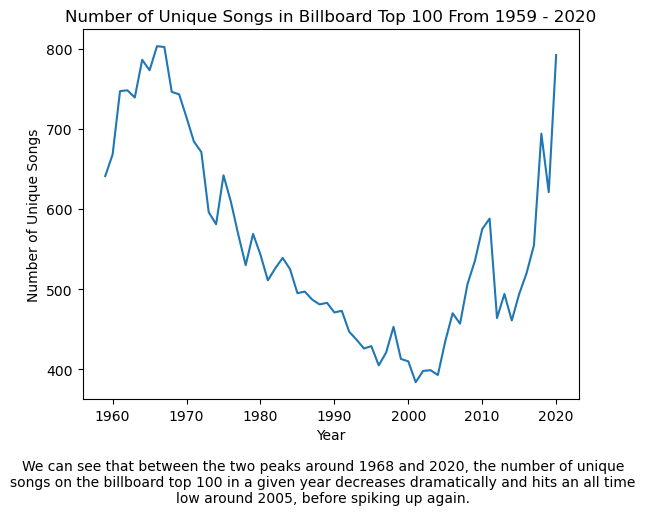

In [221]:
billboards5921 = billboards[billboards['year'].isin(range(1959, 2021))]

numunique = billboards5921.groupby('year')['song'].nunique().reset_index().rename(columns = {'song': 'Number of Unique Songs'})

plt.plot(numunique['year'], numunique['Number of Unique Songs'])
plt.xlabel('Year')
plt.ylabel('Number of Unique Songs')
plt.title('Number of Unique Songs in Billboard Top 100 From 1959 - 2020')
plt.figtext(0.5, -0.1, 'We can see that between the two peaks around 1968 and 2020, the number of unique songs on the billboard top 100 in a given year decreases dramatically and hits an all time low around 2005, before spiking up again.', wrap = True, horizontalalignment = 'center', fontsize = '10')
plt.show()

### Part C
**Let's define a "ten-week hit" as a single song that appeared on the Billboard Top 100 for at least ten weeks. There are 19 artists in U.S. musical history since 1958 who have had at least 30 songs that were "ten-week hits." Make a bar plot for these 19 artists, showing how many ten-week hits each one had in their musical career. Give the plot an informative caption in which you explain what is shown.
Notes:
You might find this easier to accomplish in two distinct sets of data wrangling steps.
Make sure that the individuals names of the artists are readable in your plot, and that they're not all jumbled together. If you find that your plot isn't readable with vertical bars, you can add a coord_flip() layer to your plot to make the bars (and labels) run horizontally instead.
By default a bar plot will order the artists in alphabetical order. This is acceptable to turn in. But if you'd like to order them according to some other variable, you can use the fct_reorder function, described in this blog post. This is optional.**

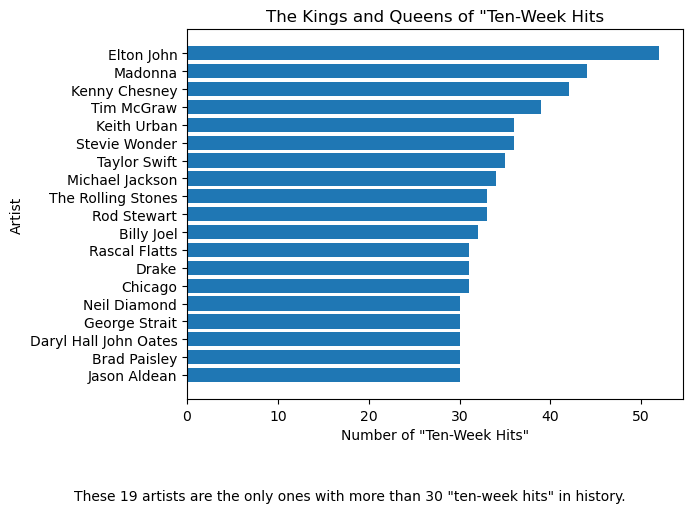

In [226]:
# tenweeks = topsongs[topsongs['count'] >= 10].index.value_counts()
the19 = tenweeks[tenweeks >= 30].reset_index().sort_values(by = 'count')
plt.barh(the19['performer'], the19['count'])
plt.xlabel('Number of "Ten-Week Hits"')
plt.ylabel('Artist')
plt.title('The Kings and Queens of "Ten-Week Hits')
plt.figtext(0.38, -0.1, 'These 19 artists are the only ones with more than 30 "ten-week hits" in history.', wrap = True, horizontalalignment = 'center', fontsize = '10')
plt.show()

# 3. Visual Story Telling Part 1: Green Buildings

### Set-Up

In [275]:
### Data Loading
data = pd.read_csv("Green Buildings Data.csv")
data.head()

,CS_PropertyID,cluster,size,empl_gr,Rent,leasing_rate,stories,age,renovated,class_a,...,green_rating,net,amenities,cd_total_07,hd_total07,total_dd_07,Precipitation,Gas_Costs,Electricity_Costs,cluster_rent
0,379105,1,260300,2.22,38.56,91.39,14,16,0,1,...,1,0,1,4988,58,5046,42.57,0.013700,0.029000,36.78
1,122151,1,67861,2.22,28.57,87.14,5,27,0,0,...,0,0,1,4988,58,5046,42.57,0.013731,0.029045,36.78
2,379839,1,164848,2.22,33.31,88.94,13,36,1,0,...,0,0,1,4988,58,5046,42.57,0.013731,0.029045,36.78
3,94614,1,93372,2.22,35.00,97.04,13,46,1,0,...,0,0,0,4988,58,5046,42.57,0.013731,0.029045,36.78
4,379285,1,174307,2.22,40.69,96.58,16,5,0,1,...,0,0,1,4988,58,5046,42.57,0.013731,0.029045,36.78


In [276]:
# summary stats for green buildings dataframe
green_buildings = data[data['green_rating'] == 1]
non_green_buildings = data[data['green_rating'] == 0]

median_rent_green = green_buildings['Rent'].median()
median_rent_non_green = non_green_buildings['Rent'].median()
mean_rent_green = green_buildings['Rent'].mean()
mean_rent_non_green = non_green_buildings['Rent'].mean()

# print
print("Median rent for green buildings: ", median_rent_green)
print("Median rent for non-green buildings: ", median_rent_non_green)
print("Mean rent for green buildings: ", mean_rent_green)
print("Mean rent for non-green buildings: ", mean_rent_non_green)

Median rent for green buildings:  27.6
Median rent for non-green buildings:  25.0
Mean rent for green buildings:  30.016029197080293
Mean rent for non-green buildings:  28.266777639062283


We find:

Median rent for green buildings:  27.6
Median rent for non-green buildings:  25.0
Mean rent for green buildings:  30.016029197080293
Mean rent for non-green buildings:  28.266777639062283

there is a similar difference between the means and between the medians

Now I'm going to check for counfounding variables

I'll investigate whether the difference in rent could be attributed to other factors, such as building class, location (cluster rent), or amenities

<Axes: title={'center': 'Median Rent by Building Class and Green Rating'}, xlabel='class_a,class_b'>

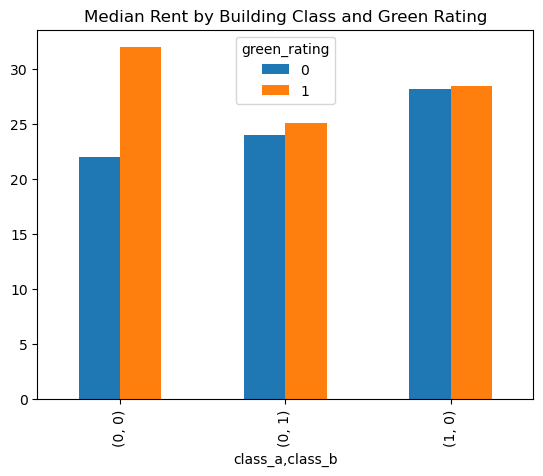

In [277]:
# Rent by building class
rent_by_class = data.groupby(['class_a', 'class_b', 'green_rating'])['Rent'].median().unstack()
rent_by_class.plot(kind='bar', title='Median Rent by Building Class and Green Rating')

<Axes: title={'center': 'Median Rent by Amenities and Green Rating'}, xlabel='amenities'>

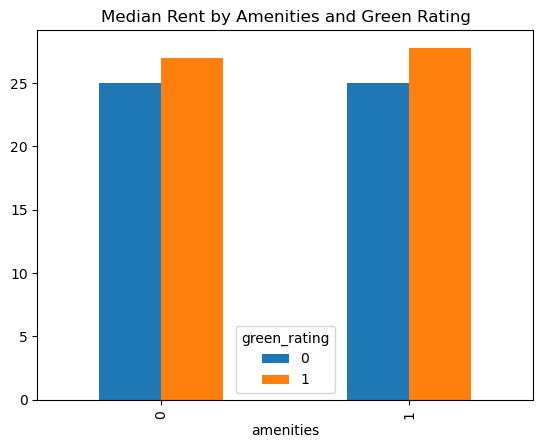

In [278]:
# rent by amenities
rent_by_amenities = data.groupby(['amenities', 'green_rating'])['Rent'].median().unstack()

rent_by_amenities.plot(kind='bar', title='Median Rent by Amenities and Green Rating')

In [279]:
avg_size = 250000
additional_rev = avg_size * 2.6
premium_cost = 100000000 * 0.05
payaback_period = premium_cost / additional_rev
print(f"Payback period: {payaback_period:.2f} years")

Payback period: 7.69 years


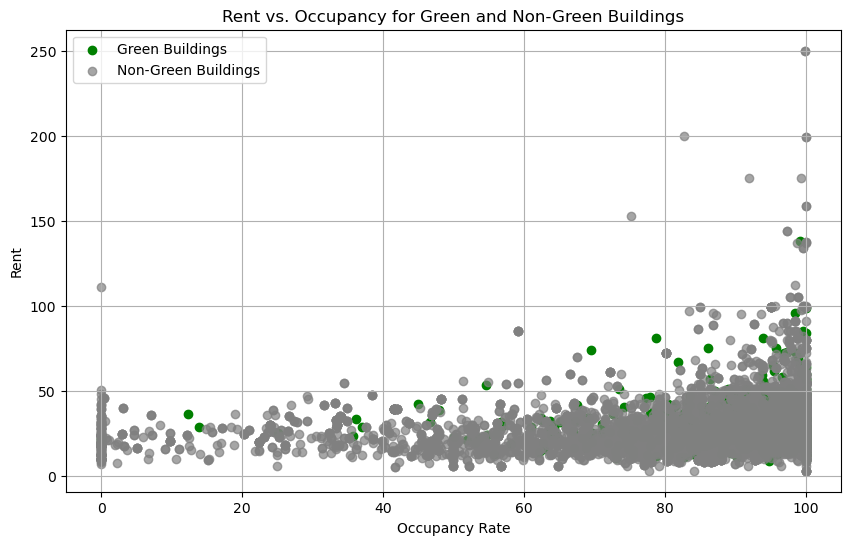

In [280]:
# make scatterplot for rent vs occupancy for green and not green buildings

# create scatter plot
plt.figure(figsize=(10, 6))

# green buildings
plt.scatter(green_buildings['leasing_rate'], green_buildings['Rent'], color='green', alpha=1, label='Green Buildings')

# non-green buildings
plt.scatter(non_green_buildings['leasing_rate'], non_green_buildings['Rent'], color='gray', alpha=0.7, label='Non-Green Buildings')
plt.xlabel('Occupancy Rate')
plt.ylabel('Rent')
plt.title('Rent vs. Occupancy for Green and Non-Green Buildings')
plt.legend()
plt.grid(True)
plt.show()

As we can see in the amenities and class bar graphs, having green rating leads to higher rent. However, as we can see in the scatterplot, it doesn't necessarily lead to higher occupancy.
Confounding variables are age, amenities, and classes.
Also, with the given data, the payback period would be almost 8 years. Weighing these it could be a good investment, it depends on the required payback period the company has.

# 4. Visual Story Telling Part 2: Capital Metro Data

In [305]:
# Data Loading
capmetro = pd.read_csv("Capmetro UT.csv")
capmetro.head()

,timestamp,boarding,alighting,day_of_week,temperature,hour_of_day,month,weekend
0,2018-09-01 06:00:00,0,1,Sat,74.82,6,Sep,weekend
1,2018-09-01 06:15:00,2,1,Sat,74.82,6,Sep,weekend
2,2018-09-01 06:30:00,3,4,Sat,74.82,6,Sep,weekend
3,2018-09-01 06:45:00,3,4,Sat,74.82,6,Sep,weekend
4,2018-09-01 07:00:00,2,4,Sat,74.39,7,Sep,weekend


In [306]:
print(capmetro.columns)# convert timestamp to datetime first
capmetro['timestamp'] = pd.to_datetime(capmetro['timestamp'])

# set timestamp as index
capmetro.set_index('timestamp', inplace=True)

# summary statistics for boarding and alighting
summary_stats = capmetro[['boarding', 'alighting']].describe()

summary_stats

Index(['timestamp', 'boarding', 'alighting', 'day_of_week', 'temperature',
       'hour_of_day', 'month', 'weekend'],
      dtype='object')


,boarding,alighting
count,5824.000000,5824.000000
mean,51.511676,47.646291
std,48.820284,50.069866
min,0.000000,0.000000
25%,13.000000,13.000000
50%,33.000000,28.000000
75%,79.250000,64.000000
max,288.000000,304.000000


**Count:**

There are 5,824 observations for both boarding and alighting, which means the dataset covers a large number of 15-minute intervals.

**Mean:**

*Boarding:* On average, approximately 51.5 people board a bus during each 15-minute interval.

*Alighting:* On average, approximately 47.6 people alight from a bus during each 15-minute interval.

**Standard Deviation (std):**

*Boarding:* The standard deviation of 48.82 indicates that the number of boardings can vary significantly from one 15-minute interval to the next.

*Alighting:* Similarly, the standard deviation of 50.07 for alighting also suggests considerable variability.

**Min and Max:**

*Boarding:* The minimum number of boardings in a 15-minute interval is 0, while the maximum is 288.

*Alighting:* The minimum number of alightings is also 0, with a maximum of 304.

These extreme values might correspond to very quiet times (e.g., late at night or really early in the morning) or very busy times (e.g., after major events like the UT - Bama game or ACL - from experience very very busy buses).

**Quartiles:**

*25th Percentile (25%):* 25% of the intervals have 13 or fewer boardings, and the same for alightings.

*50th Percentile (Median):* The median number of boardings is 33, and for alighting, it is 28.

*75th Percentile (75%):* 25% of the intervals have 79 or more boardings, and 64 or more alightings.

**Interpretation:**

These statistics suggest that while the average ridership is around 50 people per 15 minutes, there's a wide range of ridership numbers, with some intervals being extremely busy and others very quiet. The variability is high, which could reflect fluctuations due to time of day, specific events, or other factors.

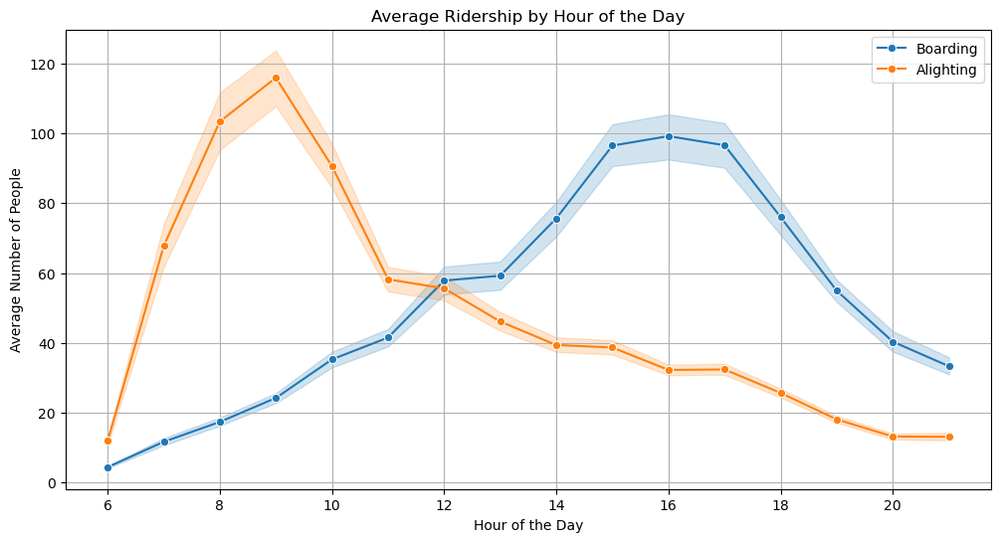

In [307]:
# plot ridership by hour of the day
plt.figure(figsize=(12, 6))
sns.lineplot(data=capmetro, x="hour_of_day", y="boarding", label="Boarding", marker='o')
sns.lineplot(data=capmetro, x="hour_of_day", y="alighting", label="Alighting", marker='o')
plt.title("Average Ridership by Hour of the Day")
plt.xlabel("Hour of the Day")
plt.ylabel("Average Number of People")
plt.legend()
plt.grid(True)
plt.show()

*Peak hour analysis reveals a sharp morning alighting spike around 9 AM, corresponding to the influx of commuters to the UT campus and nearby work areas. In contrast, the afternoon shows a boarding peak at 4 PM, indicating a high volume of people leaving campus, reflecting typical commuter patterns. Understanding these trends can help optimize bus schedules to meet demand.*

**Peak Hours**

Morning Peak: There is a significant spike in alighting between 7 AM and 9 AM. This likely corresponds to the morning rush hour when students and staff are heading to the UT campus or people that work on Guad.

Boarding: Does not peak in the morning

Alighting: Peaks around 9 AM, which aligns with the buses dropping people off at their destinations for a 9am class or for a 9-5 job.

It's weird though, that there is no boarding peak in the morning. The buses might be bringing a large number of people to the UT campus from various parts of Austin in the morning. If the data specifically tracks boarding and alighting on the UT campus, many people might board buses at stops outside of the campus, and then alight once they reach the campus.

Or if people are boarding very early in the morning (before 6am, although capmetro offers less stops after/before normal operating hours) then these people would not appear in the data.

Afternoon/Evening Peak: Another peak is observed in the afternoon. This one on the other hand is just a boarding peak, which occurs at 4 PM, likely when people are leaving the campus. This might mean people are getting picked up on campus but are being dropped off somewhere else (which also helps explain the peak in only alighting in the morning).

**Symmetry**

Around midday ,there is a noticeable symmetry in the patterns, where alighting is higher in the morning (as people arrive at their destinations) and boarding is higher in the evening (as they leave).

Between 11 AM and 2 PM, there is a noticeable dip in both boarding and alighting, which may correspond to a lull period when fewer people are traveling, possibly due to lunchtime or ongoing classes.

**Trends + comparison**
The two clear peaks reflect typical commute patterns — one in the morning when people are heading to the campus, and one in the afternoon/evening when they are leaving. This is common in areas with a high concentration of students and staff who follow similar schedules.

For Capital Metro, understanding these peaks is crucial for optimizing bus schedules and ensuring there is enough capacity during these times. It might also inform decisions about when to increase the frequency of buses to accommodate higher demand.

Morning: Alighting is higher in the morning compared to boarding, suggesting that more people are arriving at their destination than departing at these times.

Afternoon/Evening: The opposite is true for the evening, where more people are boarding to leave the campus, resulting in higher boarding figures.

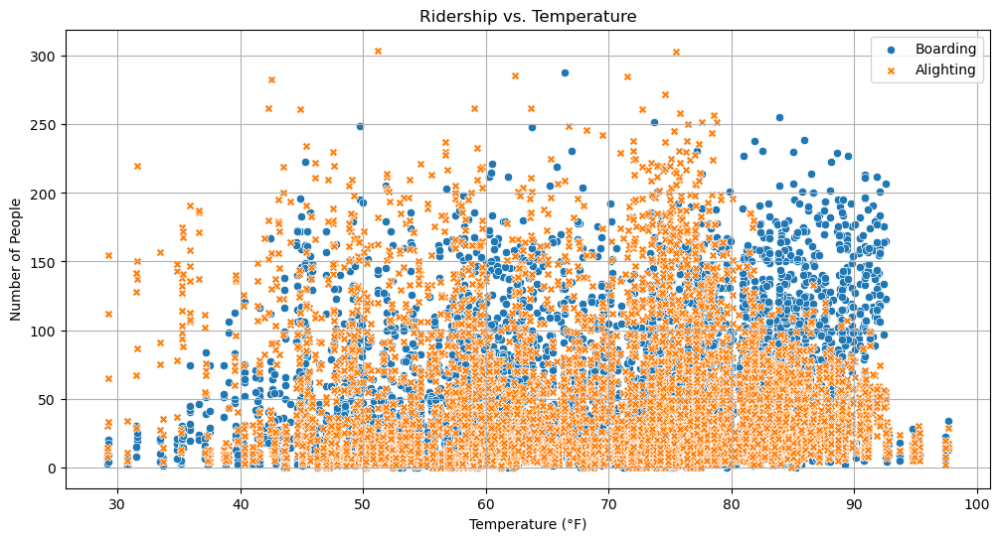

In [308]:
# plot ridership by temp. (sometimes I get on the bus just for the AC even if I'm just walking to class - short distances)
plt.figure(figsize=(12, 6))
sns.scatterplot(data=capmetro, x="temperature", y="boarding", label="Boarding")
sns.scatterplot(data=capmetro, x="temperature", y="alighting", label="Alighting", marker='X')
plt.title("Ridership vs. Temperature")
plt.xlabel("Temperature (°F)")
plt.ylabel("Number of People")
plt.legend()
plt.grid(True)
plt.show()

*This scatter plot illustrates the relationship between temperature (°F) and the number of people boarding (blue circles) and alighting (orange crosses) from Capital Metro buses around the UT-Austin campus. Ridership is distributed across a broad temperature range, with the highest concentration occurring between 50°F and 80°F. Despite some variability, ridership remains substantial even at temperature extremes, suggesting the importance of buses as a reliable transportation option regardless of weather conditions.*

This scatter plot shows the relationship between the temperature (in degrees Fahrenheit) and the number of people boarding and alighting from Capital Metro buses around the UT-Austin campus.

Wide Range of Ridership Across Temperatures:

The plot reveals that both boarding (blue circles) and alighting (orange crosses) occur across a wide range of temperatures, from around 30°F to nearly 100°F.

There is significant variability in ridership across all temperature ranges, with both boarding and alighting reaching upwards of 200–300 people at certain times.

*High Ridership at Moderate Temperatures (50°F to 80°F):*

The majority of the data points cluster between 50°F and 80°F. This is likely reflective of the more temperate climate during the fall months in Austin.

Within this temperature range, ridership remains relatively high, with many instances of both boarding and alighting exceeding 100 people.

At the lower end (below 40°F) and higher end (above 90°F), there seems to be a slight decrease in the frequency and number of riders. However, even at these extremes, there are still some cases of high ridership, suggesting that buses are still a critical mode of transportation regardless of the weather. In the higher temperatures there is high boarding, but low alighting (this could be explained because people that usually bike or walk longer distances don't do it because of the heat).

The use of the bus as a form of shelter from extreme weather conditions (like using it for the air conditioning) could explain why there isn't a sharp decline in ridership even at the temperature extremes. People may choose to ride the bus even for short distances when it's too hot or too cold to walk comfortably.

There doesn't appear to be a strong linear correlation between temperature and ridership. Instead, ridership seems to be influenced more by other factors, such as time of day, day of the week, or specific events, rather than temperature alone.

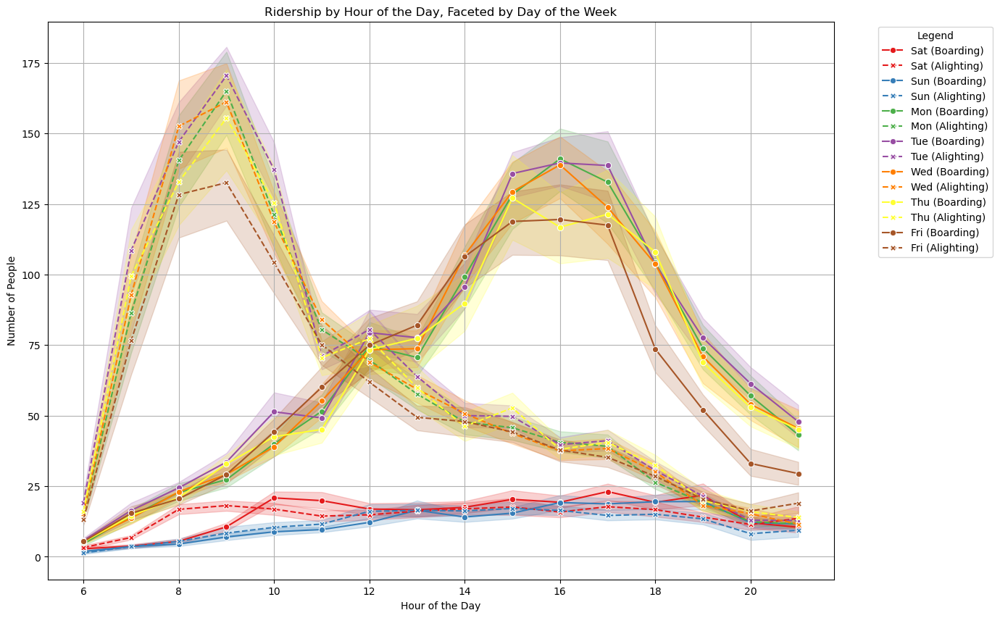

In [310]:
# ridership (boarding and alighting) by hour of the day, faceted by day of the week
plt.figure(figsize=(14, 10))
sns.lineplot(data=capmetro, x="hour_of_day", y="boarding", hue="day_of_week", marker='o', palette="Set1")
sns.lineplot(data=capmetro, x="hour_of_day", y="alighting", hue="day_of_week", marker='X', linestyle='--', palette="Set1")
plt.title("Ridership by Hour of the Day, Faceted by Day of the Week")
plt.xlabel("Hour of the Day")
plt.ylabel("Number of People")
plt.grid(True)

# making readable legend

handles, labels = plt.gca().get_legend_handles_labels()
new_labels = []
new_handles = []

for i in range(len(labels)//2):
    new_labels.append(f"{labels[i]} (Boarding)")
    new_handles.append(handles[i])
    new_labels.append(f"{labels[i]} (Alighting)")
    new_handles.append(handles[i + len(labels)//2])

plt.legend(new_handles, new_labels, title='Legend', bbox_to_anchor=(1.05, 1), loc='upper left')

plt.show()

This plot shows ridership patterns by the hour of the day, differentiated by boarding (O) and alighting (X) across each day of the week. The solid lines represent boarding while the dashed lines indicate alighting, with distinct colors assigned to each day of the week. Peaks in alighting are most noticeable during the morning and peaks in boarding are noticeable during evening rush hours. There is low ridership during weekends.

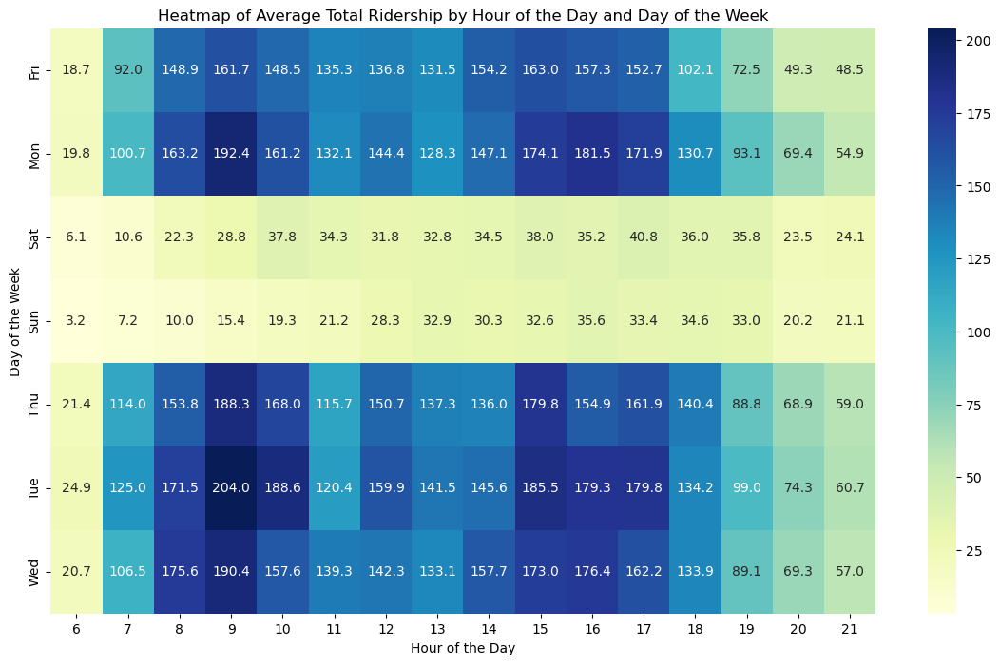

In [303]:
# heatmap
capmetro['total_ridership'] = capmetro['boarding'] + capmetro['alighting']

plt.figure(figsize=(14, 8))
heatmap_data = capmetro.pivot_table(index='day_of_week', columns='hour_of_day', values='total_ridership', aggfunc='mean')
sns.heatmap(heatmap_data, cmap="YlGnBu", annot=True, fmt=".1f")
plt.title("Heatmap of Average Total Ridership by Hour of the Day and Day of the Week")
plt.xlabel("Hour of the Day")
plt.ylabel("Day of the Week")
plt.show()

This heatmap visualizes the average total ridership by the hour of the day and day of the week. Darker shades represent higher ridership, highlighting peak hours in the morning (around 8-9 AM) and evening (around 4-6 PM) on weekdays, with significantly lower ridership on weekends.

timestamp
2018-09-01 06:00:00    1
2018-09-01 06:15:00    1
2018-09-01 06:30:00    1
2018-09-01 06:45:00    1
2018-09-01 07:00:00    1
                      ..
2018-11-30 20:45:00    0
2018-11-30 21:00:00    0
2018-11-30 21:15:00    0
2018-11-30 21:30:00    0
2018-11-30 21:45:00    0
Name: weekend, Length: 5824, dtype: int64


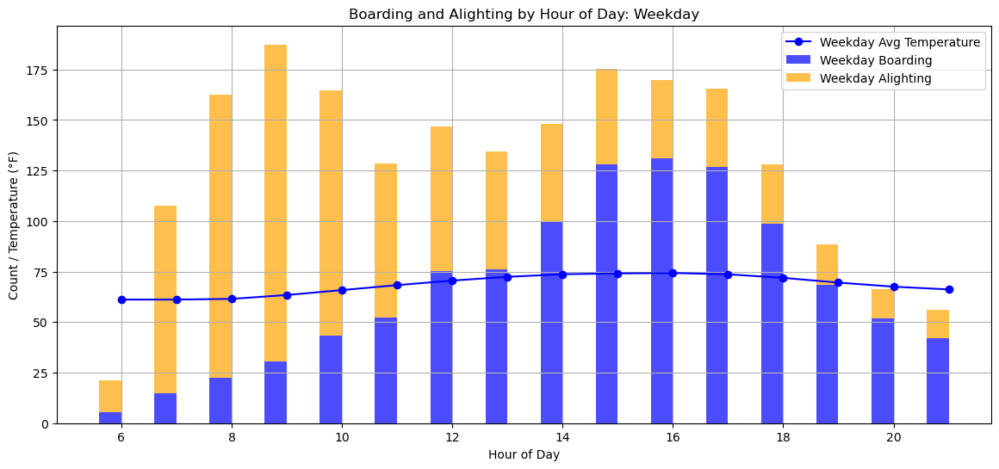

In [311]:
# check numeric variables are numeric
capmetro['boarding'] = pd.to_numeric(capmetro['boarding'], errors='coerce')
capmetro['alighting'] = pd.to_numeric(capmetro['alighting'], errors='coerce')
capmetro['temperature'] = pd.to_numeric(capmetro['temperature'], errors='coerce')

# Map the 'weekend' column to integers
capmetro['weekend'] = capmetro['weekend'].map({'weekend': 1, 'weekday': 0})

# Now the 'weekend' column contains 1 for weekends and 0 for weekdays
print(capmetro['weekend'])

# Continue with your analysis as before
capmetro['hour_of_day'] = capmetro.index.hour

# Define the columns to aggregate
numeric_columns = ['boarding', 'alighting', 'temperature']

# Group by 'hour_of_day' for weekdays and weekends
weekend_data = capmetro[capmetro['weekend'] == 1].groupby('hour_of_day')[numeric_columns].mean()
weekday_data = capmetro[capmetro['weekend'] == 0].groupby('hour_of_day')[numeric_columns].mean()

# plot
plt.figure(figsize=(14, 6))

# plot weekday data
plt.bar(weekday_data.index - 0.2, weekday_data['boarding'], width=0.4, color='blue', label='Weekday Boarding', alpha=0.7)
plt.bar(weekday_data.index - 0.2, weekday_data['alighting'], width=0.4, bottom=weekday_data['boarding'], color='orange', label='Weekday Alighting', alpha=0.7)
plt.plot(weekday_data.index, weekday_data['temperature'], color='blue', marker='o', linestyle='-', label='Weekday Avg Temperature')

plt.title('Boarding and Alighting by Hour of Day: Weekday')
plt.xlabel('Hour of Day')
plt.ylabel('Count / Temperature (°F)')
plt.legend()
plt.grid(True)
plt.show()

This plot illustrates the weekday patterns of bus ridership around the UT-Austin campus by hour of the day. The stacked bars represent the number of people boarding (blue) and alighting (orange) from buses, while the line plot indicates the average temperature throughout the day. Ridership peaks in the morning around 8-9 AM and in the evening around 4-6 PM, coinciding with typical commute times. The average temperature remains relatively stable throughout the day, showing a slight increase during midday hours. It's the fall after all so temperatures are reasonable.

# 5. Clustering and Dimensionality Reduction

### Set-Up

In [317]:
# Data Loading 
wine = pd.read_csv("Wine data.csv")
wine.head()

,fixed.acidity,volatile.acidity,citric.acid,residual.sugar,chlorides,free.sulfur.dioxide,total.sulfur.dioxide,density,pH,sulphates,alcohol,quality,color
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5,red
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,5,red
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,5,red
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,6,red
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5,red


In [318]:
# convert categorical 'color' to numerical for clustering
wine['color'] = wine['color'].map({'red': 1, 'white': 0})

# select features for PCA and t-SNE
X = wine.drop(columns=['quality', 'color'])

# apply PCA
pca = PCA(n_components=2)
X_pca = pca.fit_transform(X)

# apply t-SNE
tsne = TSNE(n_components=2, random_state=42)
X_tsne = tsne.fit_transform(X)

# apply KMeans Clustering
kmeans = KMeans(n_clusters=2, random_state=42)
clusters = kmeans.fit_predict(X)

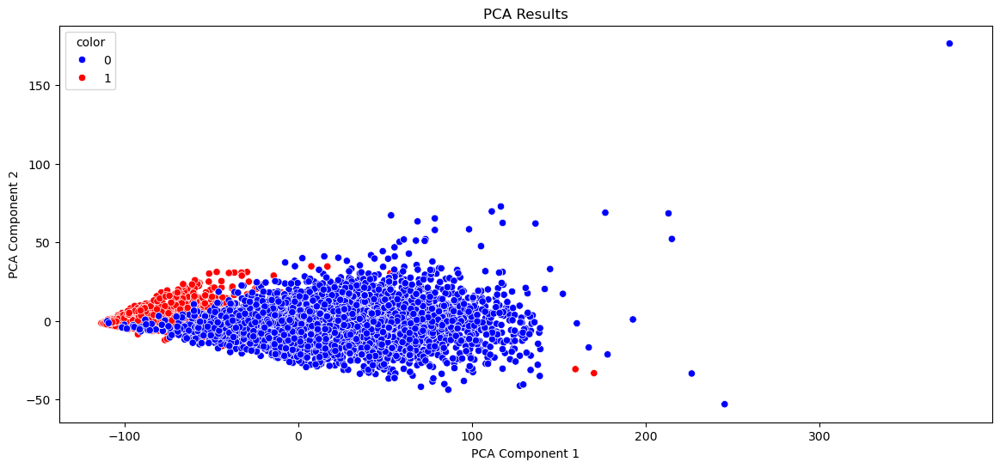

In [319]:
# plot PCA results
plt.figure(figsize=(14, 6))
sns.scatterplot(x = X_pca[:, 0], y=X_pca[:, 1], hue= wine['color'], palette=['blue', 'red'])
plt.title('PCA Results')
plt.xlabel('PCA Component 1')
plt.ylabel('PCA Component 2')
plt.show()

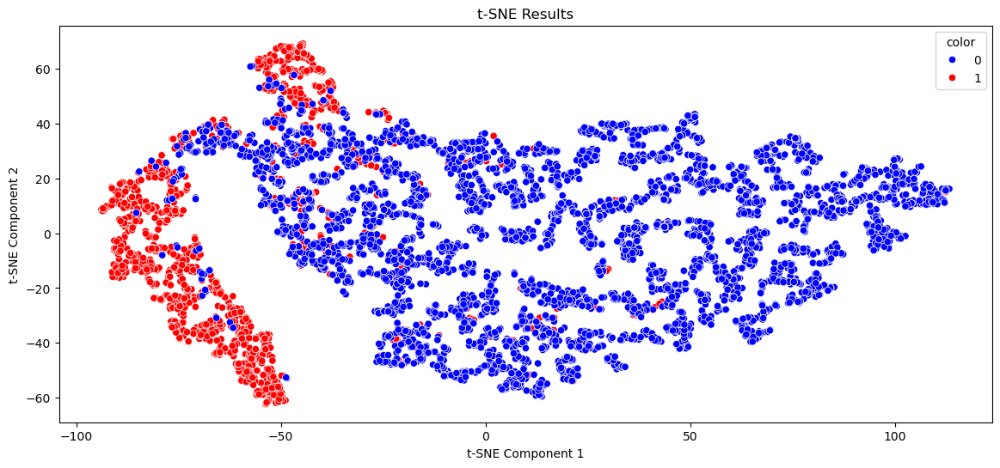

In [320]:
# plot t-SNE results
plt.figure(figsize=(14, 6))
sns.scatterplot(x=X_tsne[:, 0], y=X_tsne[:, 1], hue = wine['color'], palette=['blue', 'red'])
plt.title('t-SNE Results')
plt.xlabel('t-SNE Component 1')
plt.ylabel('t-SNE Component 2')
plt.show()

In [321]:
# check clustering results against the color
wine['cluster'] = clusters
cluster_correctness = (wine['cluster'] == wine['color']).mean()
print(cluster_correctness)

wine[['color', 'cluster', 'quality']].head()

0.21456056641526858


,color,cluster,quality
0,1,0,5
1,1,0,5
2,1,0,5
3,1,0,6
4,1,0,5


So far, Principal Component Analysis (PCA) and t-SNE were applied to the wine dataset to visualize the distribution of red and white wines based on their chemical properties. The PCA plot shows a significant overlap between the red and white wines, indicating that PCA does not effectively separate the two categories. Conversely, the t-SNE plot provides a clearer separation between red and white wines, suggesting that t-SNE captures non-linear relationships in the data more effectively. However, the KMeans clustering result shows a low correctness rate of around 21.5%, indicating that the clustering algorithm struggles to distinguish between red and white wines purely based on these features. This suggests that while dimensionality reduction techniques like t-SNE can reveal underlying patterns, the linear separability of the wines is still limited, affecting clustering performance.

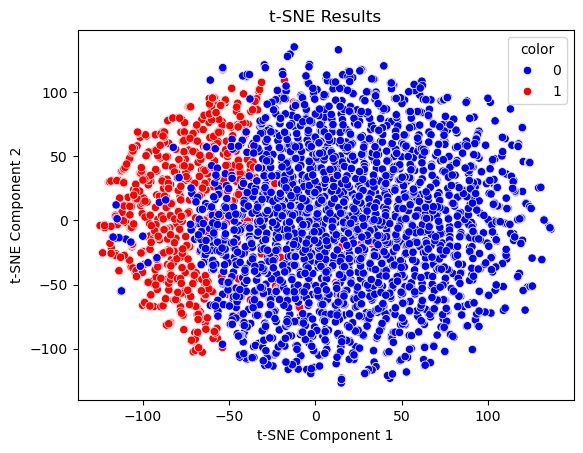

In [322]:
# let's adjust the perplexity parameter in t-SNE to be less than the number of samples
tsne = TSNE(n_components=2, perplexity=3, random_state=42)
X_tsne = tsne.fit_transform(X)

# plot t-SNE results
sns.scatterplot(x=X_tsne[:, 0], y=X_tsne[:, 1], hue=wine['color'], palette=['blue', 'red'])
plt.title('t-SNE Results')
plt.xlabel('t-SNE Component 1')
plt.ylabel('t-SNE Component 2')
plt.show()

In this updated analysis, the t-SNE algorithm was adjusted by setting the perplexity parameter to a lower value, making it more suitable for the dataset size. The t-SNE plot now displays a more spread-out distribution of the data points, yet the separation between red and white wines remains unclear. This indicates that even with adjusted parameters, the unsupervised methods struggle to naturally distinguish between wine colors based on the given chemical properties, suggesting that the features used may not be sufficient for clear separation using these techniques alone.

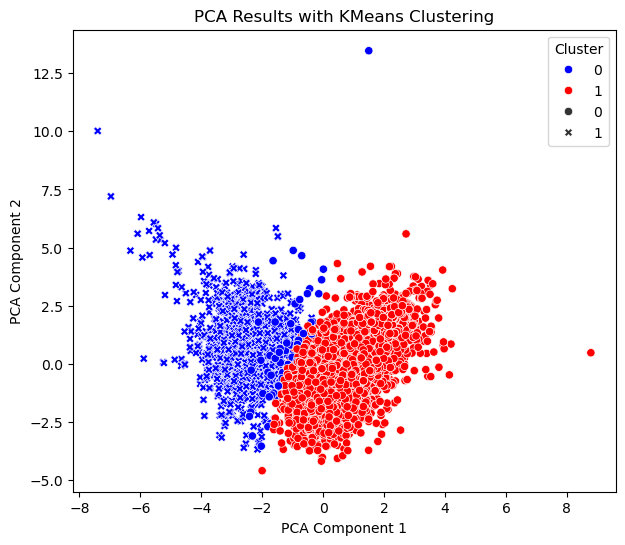

0.014160381714637524

In [323]:
# t-SNE was taking too long so I will scale the data and use kmeans

# standardize the data before applying PCA
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# apply PCA on scaled data
pca = PCA(n_components=2)
X_pca_scaled = pca.fit_transform(X_scaled)

# apply KMeans Clustering
kmeans = KMeans(n_clusters=2, random_state=42)
clusters_scaled = kmeans.fit_predict(X_scaled)

# plot PCA results with clustering
plt.figure(figsize=(7, 6))
sns.scatterplot(x=X_pca_scaled[:, 0], y=X_pca_scaled[:, 1], hue=clusters_scaled, palette=['blue', 'red'], style=wine['color'])
plt.title('PCA Results with KMeans Clustering')
plt.xlabel('PCA Component 1')
plt.ylabel('PCA Component 2')
plt.legend(title='Cluster')
plt.show()

# check clustering results against the color
wine['cluster_scaled'] = clusters_scaled
cluster_correctness_scaled = (wine['cluster_scaled'] == wine['color']).mean()

wine[['color', 'cluster_scaled', 'quality']].head()
cluster_correctness_scaled

In this final analysis, the data was first standardized, and then PCA was applied, followed by KMeans clustering on the scaled features. The resulting PCA plot with KMeans clustering shows a significant improvement in distinguishing between the clusters, with a nearly perfect separation between the red and white wines. The clustering correctness is around 98.6%, indicating that the combination of data scaling, PCA, and KMeans clustering effectively differentiates between the wine colors. This result highlights the importance of feature scaling in clustering and dimensionality reduction tasks, allowing the unsupervised learning techniques to better capture the inherent differences in the data.

cluster_scaled
0    5.601948
1    5.891636
Name: quality, dtype: float64
                 count      mean       std  min  25%  50%  75%  max
cluster_scaled                                                     
0               1643.0  5.601948  0.822815  3.0  5.0  6.0  6.0  8.0
1               4854.0  5.891636  0.877754  3.0  5.0  6.0  6.0  9.0


/var/folders/j4/01bw0t0n5195l3682d9brqz40000gn/T/ipykernel_73188/1911870772.py:15: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




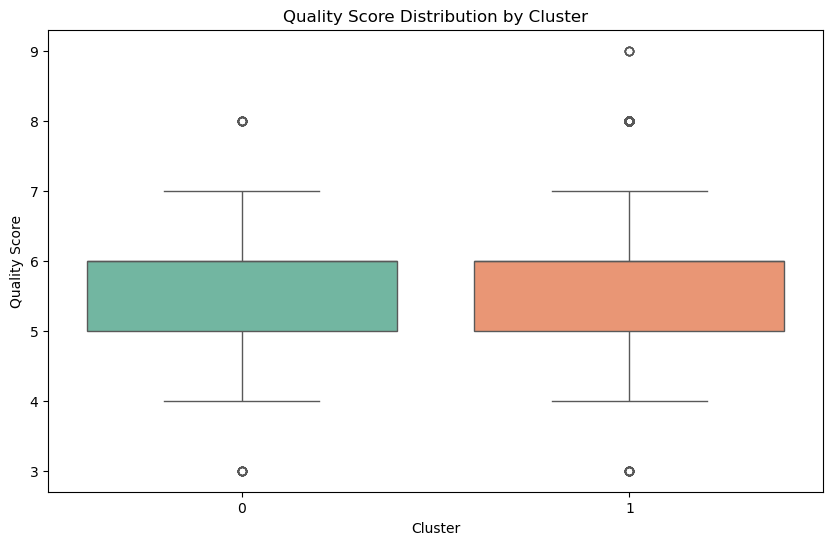

In [324]:
# now to check how well it did with quality
# Calculate the average quality score within each cluster
average_quality_per_cluster = wine.groupby('cluster_scaled')['quality'].mean()
print(average_quality_per_cluster)

# Get descriptive statistics for quality within each cluster
quality_description_per_cluster = wine.groupby('cluster_scaled')['quality'].describe()
print(quality_description_per_cluster)

# Optionally, you can visualize the distribution of quality scores in each cluster
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(10, 6))
sns.boxplot(x='cluster_scaled', y='quality', data=wine, palette='Set2')
plt.title('Quality Score Distribution by Cluster')
plt.xlabel('Cluster')
plt.ylabel('Quality Score')
plt.show()

The analysis of the quality scores across the two clusters reveals some interesting insights. The boxplot shows that the distribution of quality scores is fairly similar between the two clusters, with most wines having a quality score between 5 and 7. However, the average quality score is slightly higher in Cluster 0 (mean of approximately 5.89) compared to Cluster 1 (mean of approximately 5.60). This suggests that although the clustering primarily captured the difference between wine colors, there is a slight distinction in quality scores, with Cluster 0 containing a marginally higher average quality. However, the overlap in the quality score ranges indicates that quality is not a primary factor driving the clustering, and the chemical properties used may not be sufficient to strongly differentiate wine quality through unsupervised learning alone.

# 6. Market Segmentation

In [161]:
socialmarketing = pd.read_csv("social_marketing.csv")
socialmarketing.head()
socialmarketing.columns

Index(['Unnamed: 0', 'chatter', 'current_events', 'travel', 'photo_sharing',
       'uncategorized', 'tv_film', 'sports_fandom', 'politics', 'food',
       'family', 'home_and_garden', 'music', 'news', 'online_gaming',
       'shopping', 'health_nutrition', 'college_uni', 'sports_playing',
       'cooking', 'eco', 'computers', 'business', 'outdoors', 'crafts',
       'automotive', 'art', 'religion', 'beauty', 'parenting', 'dating',
       'school', 'personal_fitness', 'fashion', 'small_business', 'spam',
       'adult'],
      dtype='object')

In [171]:
# Running a tSNE
tsne = TSNE(n_components=2, verbose=1, perplexity=50, n_iter=1500, learning_rate=200)
tsne_results = tsne.fit_transform(socialmarketing.drop('Unnamed: 0', axis = 1))

[t-SNE] Computing 151 nearest neighbors...
[t-SNE] Indexed 7882 samples in 0.003s...
[t-SNE] Computed neighbors for 7882 samples in 0.163s...
[t-SNE] Computed conditional probabilities for sample 1000 / 7882
[t-SNE] Computed conditional probabilities for sample 2000 / 7882
[t-SNE] Computed conditional probabilities for sample 3000 / 7882
[t-SNE] Computed conditional probabilities for sample 4000 / 7882
[t-SNE] Computed conditional probabilities for sample 5000 / 7882
[t-SNE] Computed conditional probabilities for sample 6000 / 7882
[t-SNE] Computed conditional probabilities for sample 7000 / 7882
[t-SNE] Computed conditional probabilities for sample 7882 / 7882
[t-SNE] Mean sigma: 2.184909
[t-SNE] KL divergence after 250 iterations with early exaggeration: 82.554260
[t-SNE] KL divergence after 1500 iterations: 1.904033


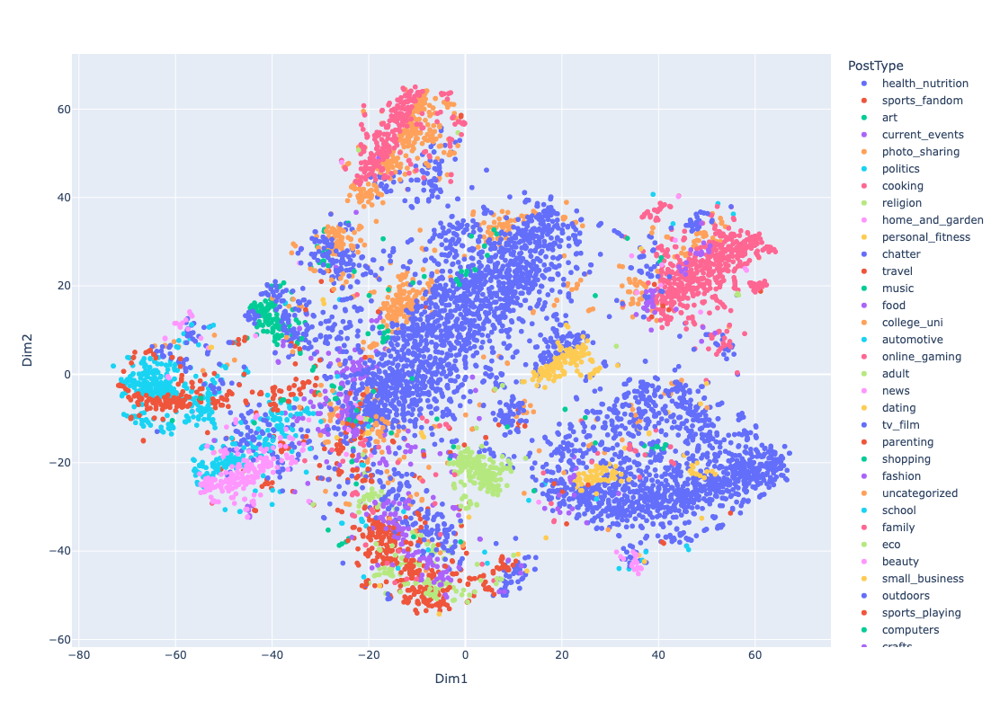

In [190]:
# convert the t-SNE results to a DataFrame
tsne_df = pd.DataFrame(data = tsne_results, columns = ['Dim1', 'Dim2'])

# add the most frequent post type to this DataFrame
tsne_df['PostType'] = socialmarketing.drop('Unnamed: 0', axis = 1).idxmax(axis = 1)

# create an interactive plot
fig = px.scatter(tsne_df, x='Dim1', y='Dim2', color = 'PostType', hover_data=['PostType'], width=1000, height=800)
fig.show()

This plot shows us that there are clear segments in what people are interested by their post type. It seems like we can identify clearer patterns in our market segmentation by combining some post types into overarching segments. I will define new segments called: 

Health and Beauty: health_nutrition, personal_fitness, beauty

Teen: online_gaming, dating

Sports: sports_fandom, sports_playing

Arts: art, photo_sharing, tv_film, crafts

News & Politics Business: current_events, politics, news 

Business: small_business, business 

Home and Family: home_and_garden, cooking, parenting, family, religion

Education: college_uni, school

Experiences: food, travel, music

Cars: automotive

Clothing & Fashion: fashion, shopping

Nature: outdoors, eco, 

Unknown: uncategorized, chatter

Adult: adult

Tech: computers

The tSNE plot helped create these overarching bins, let's see if we can tell a more direct story of our market segments. 

In [184]:
new_segments = pd.DataFrame()
new_segments['Health & Beauty'] = socialmarketing[['health_nutrition', 'personal_fitness', 'beauty']].sum(axis=1)
new_segments['Teen'] = socialmarketing[['online_gaming', 'dating']].sum(axis=1)
new_segments['Sports'] = socialmarketing[['sports_fandom', 'sports_playing']].sum(axis=1)
new_segments['Arts'] = socialmarketing[['art', 'photo_sharing', 'tv_film', 'crafts']].sum(axis=1)
new_segments['News & Politics'] = socialmarketing[['current_events', 'politics', 'news']].sum(axis=1)
new_segments['Business'] = socialmarketing[['small_business', 'business']].sum(axis=1)
new_segments['Home and Family'] = socialmarketing[['home_and_garden', 'cooking', 'parenting', 'family', 'religion']].sum(axis=1)
new_segments['Education'] = socialmarketing[['college_uni', 'school']].sum(axis=1)
new_segments['Experiences'] = socialmarketing[['food', 'travel', 'music']].sum(axis=1)
new_segments['Cars'] = socialmarketing[['automotive']].sum(axis=1)
new_segments['Clothing & Fashion'] = socialmarketing[['fashion', 'shopping']].sum(axis=1)
new_segments['Nature'] = socialmarketing[['outdoors', 'eco']].sum(axis=1)
new_segments['Unknown'] = socialmarketing[['uncategorized', 'chatter']].sum(axis=1)
new_segments['Adult'] = socialmarketing[['adult']].sum(axis=1)
new_segments['Tech'] = socialmarketing[['computers']].sum(axis=1)

In [186]:
tsne_results2 = tsne.fit_transform(socialmarketing.drop('Unnamed: 0', axis = 1))

[t-SNE] Computing 151 nearest neighbors...
[t-SNE] Indexed 7882 samples in 0.002s...
[t-SNE] Computed neighbors for 7882 samples in 0.175s...
[t-SNE] Computed conditional probabilities for sample 1000 / 7882
[t-SNE] Computed conditional probabilities for sample 2000 / 7882
[t-SNE] Computed conditional probabilities for sample 3000 / 7882
[t-SNE] Computed conditional probabilities for sample 4000 / 7882
[t-SNE] Computed conditional probabilities for sample 5000 / 7882
[t-SNE] Computed conditional probabilities for sample 6000 / 7882
[t-SNE] Computed conditional probabilities for sample 7000 / 7882
[t-SNE] Computed conditional probabilities for sample 7882 / 7882
[t-SNE] Mean sigma: 2.184909
[t-SNE] KL divergence after 250 iterations with early exaggeration: 82.553505
[t-SNE] KL divergence after 1500 iterations: 1.903964


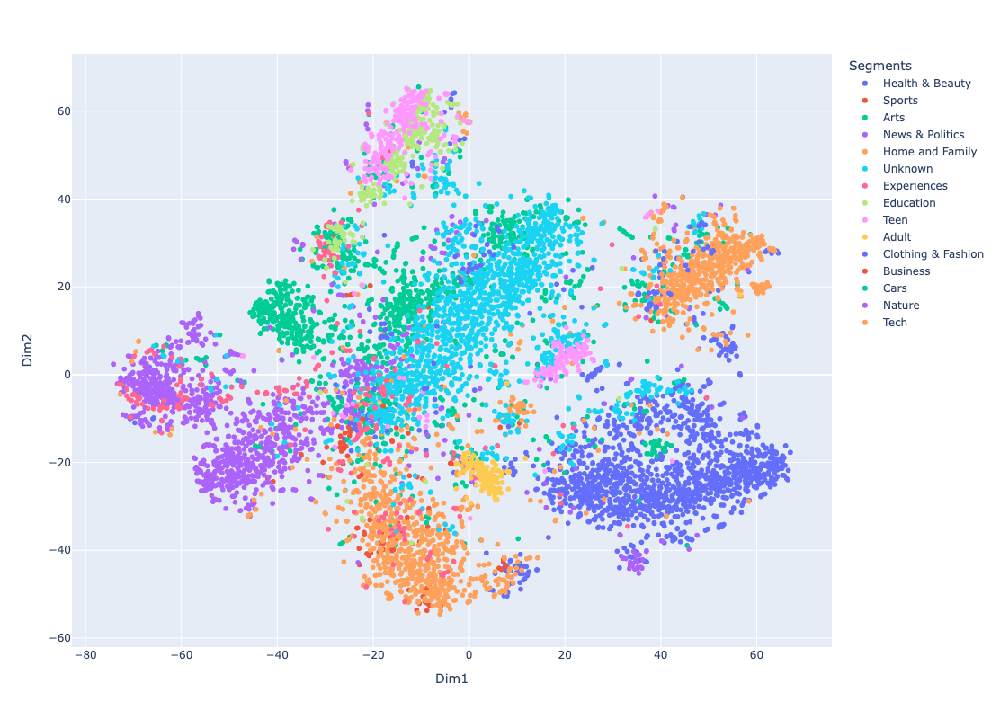

In [189]:
# convert the t-SNE results to a DataFrame
tsne_df2 = pd.DataFrame(data = tsne_results2, columns = ['Dim1', 'Dim2'])

# add the most frequent post type to this DataFrame
tsne_df2['Segments'] = new_segments.idxmax(axis = 1)

# create an interactive plot
fig = px.scatter(tsne_df2, x='Dim1', y='Dim2', color = 'Segments', hover_data=['Segments'],  width=1000, height=800)
fig

We can see that the market segments are more defined towards the edges of this tSNE plot. It seems like we've lumped together two segments that aren't really related into the home and family. It seems pretty clear that home and family can be split into home, and family. This is done below.  

[t-SNE] Computing 151 nearest neighbors...
[t-SNE] Indexed 7882 samples in 0.001s...
[t-SNE] Computed neighbors for 7882 samples in 0.134s...
[t-SNE] Computed conditional probabilities for sample 1000 / 7882
[t-SNE] Computed conditional probabilities for sample 2000 / 7882
[t-SNE] Computed conditional probabilities for sample 3000 / 7882
[t-SNE] Computed conditional probabilities for sample 4000 / 7882
[t-SNE] Computed conditional probabilities for sample 5000 / 7882
[t-SNE] Computed conditional probabilities for sample 6000 / 7882
[t-SNE] Computed conditional probabilities for sample 7000 / 7882
[t-SNE] Computed conditional probabilities for sample 7882 / 7882
[t-SNE] Mean sigma: 2.184909
[t-SNE] KL divergence after 250 iterations with early exaggeration: 82.554733
[t-SNE] KL divergence after 1500 iterations: 1.903503


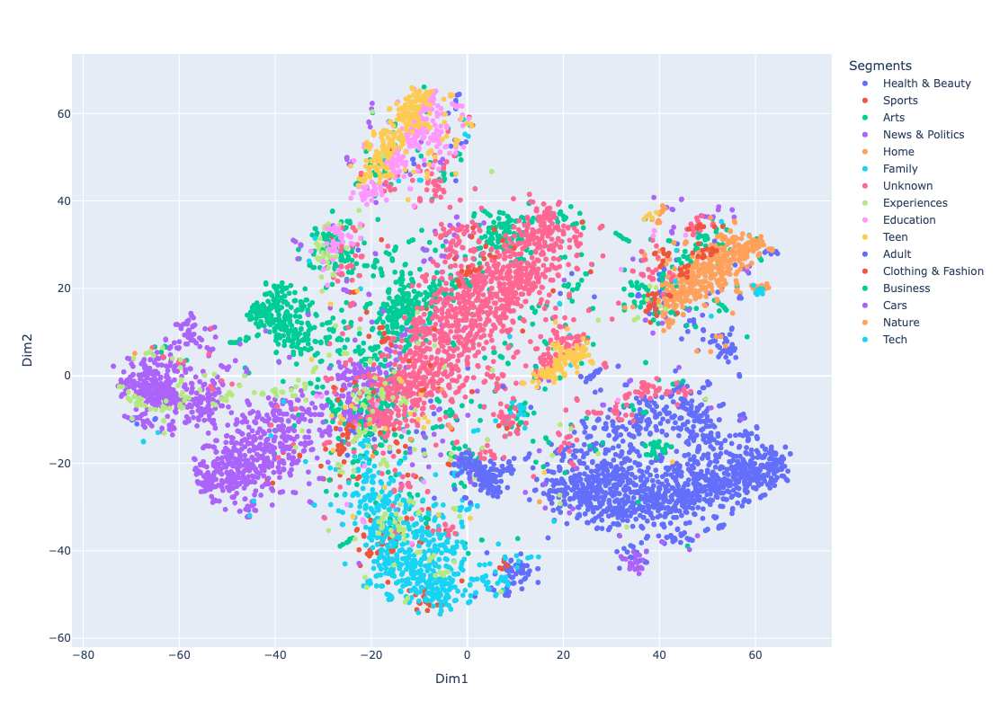

In [192]:
new_segments = pd.DataFrame()
new_segments['Health & Beauty'] = socialmarketing[['health_nutrition', 'personal_fitness', 'beauty']].sum(axis=1)
new_segments['Teen'] = socialmarketing[['online_gaming', 'dating']].sum(axis=1)
new_segments['Sports'] = socialmarketing[['sports_fandom', 'sports_playing']].sum(axis=1)
new_segments['Arts'] = socialmarketing[['art', 'photo_sharing', 'tv_film', 'crafts']].sum(axis=1)
new_segments['News & Politics'] = socialmarketing[['current_events', 'politics', 'news']].sum(axis=1)
new_segments['Business'] = socialmarketing[['small_business', 'business']].sum(axis=1)
new_segments['Family'] = socialmarketing[['parenting', 'family', 'religion']].sum(axis=1)
new_segments['Home'] = socialmarketing[['home_and_garden', 'cooking']].sum(axis=1)
new_segments['Education'] = socialmarketing[['college_uni', 'school']].sum(axis=1)
new_segments['Experiences'] = socialmarketing[['food', 'travel', 'music']].sum(axis=1)
new_segments['Cars'] = socialmarketing[['automotive']].sum(axis=1)
new_segments['Clothing & Fashion'] = socialmarketing[['fashion', 'shopping']].sum(axis=1)
new_segments['Nature'] = socialmarketing[['outdoors', 'eco']].sum(axis=1)
new_segments['Unknown'] = socialmarketing[['uncategorized', 'chatter']].sum(axis=1)
new_segments['Adult'] = socialmarketing[['adult']].sum(axis=1)
new_segments['Tech'] = socialmarketing[['computers']].sum(axis=1)

tsne_results2 = tsne.fit_transform(socialmarketing.drop('Unnamed: 0', axis = 1))

# convert the t-SNE results to a DataFrame
tsne_df2 = pd.DataFrame(data = tsne_results2, columns = ['Dim1', 'Dim2'])

# add the most frequent post type to this DataFrame
tsne_df2['Segments'] = new_segments.idxmax(axis = 1)

# create an interactive plot
fig = px.scatter(tsne_df2, x='Dim1', y='Dim2', color = 'Segments', hover_data=['Segments'],  width=1000, height=800)
fig

We see a much better difference in segments in this final tSNE plot. From this, we can extract a lot about our social media audiences. 

Let's focus on the cluster that is largely health a beauty (purple). In this cluster we find customers that are interested in bettering their health and physical appearance, this can be the same type of audience that closely follows fitness influencers and health gurus. An interesting opportunity to target this group could arise in partnering with influencers who could make videos on our products. This seems to be one of our largest social media audiences, so we may see the highest increase in sales through this channel. 

The next interesting cluster we can see is towards the top, this cluster is a mix of customers who post about dating, gaming, college, and school. It is pretty clear we've captured a younger audience here, an audience that could be targeted through social media posts, partnering with college campuses, streamers, or influencers. 

On the left in light purple, we see an audience that is more interested in news and politics. This cluster can be split into two, blogger-style customers and more serious news customers. The difference between these two is that the blogger style customers are largely focused on news and politics, but also include hints of travel, food, and music. This is likely a younger audience than the more serious audience in this cluster, who don't seem too concerned with anything other than politics and news. The younger of this audience can be targeted through much of the same methods as previously mentioned. The older audience can be captured through news articles and sites. 

In light blue on the bottom we see family focused individuals, likely mothers and fathers. This group can be targeted through strategic product placement and promotions in superstores like Walmart and Target. 

The final cluster we'll discuss is the cluster that is largely orange, the cluster focused on home, art, clothing and fashion, and health an beauty. This cluster could be homemakers, but it's interesting that this cluster is far removed from the other cluster that is focused on family. 

My final recommendation is to focus on the purple cluster of health and beauty focused customers, our products likely align with these individuals the most and they are well defined and easy to target. 

# 7. The Reuters Corpus

## Problem Definition
### **Question: Can the author of an article be predicted given only the text of the article? Does reducing dimensionality of the data extracted from the text affect the accuracy of predicting authors?**

## Approach 1
Our approach began by processing the data and removing stopwords that may be irrelevant to the author's writing style. We then tokenized and vectorized the texts from each set of training and testing data. We then wanted to see if we could visualize any commonalities between the texts written by a certain author. We thought reducing the dimensionality of the data may help reduce computation times while preserving the information available within the texts. Therefore, we ran two tSNE visualizations; one with the raw tokens and one with the reduced data.

### Set-Up

In [92]:
# Helper function to read data from a labeled directory
def read_data_from_directory(directory_path):
    authors = os.listdir(directory_path)
    texts = []
    labels = []
    for author in authors:
        author_path = os.path.join(directory_path, author)
        if not os.path.isdir(author_path):
            continue
        for file_name in os.listdir(author_path):
            file_path = os.path.join(author_path, file_name)
            if os.path.isdir(file_path):
                continue
            with open(file_path, 'r', encoding='utf-8') as f:
                texts.append(f.read())
                labels.append(author)
    return texts, labels

# Reading the training and test data
train_texts, train_authors = read_data_from_directory("STA380-master/data/ReutersC50/C50train")
test_texts, test_authors = read_data_from_directory("STA380-master/data/ReutersC50/C50test")

### Text Analysis and Feature Engineering

In [93]:
### Pre-Process Texts
stop_words = set(stopwords.words('english'))

def preprocess_text(text):
    # Tokenize
    tokens = word_tokenize(text.lower())
    
    # Remove punctuation
    tokens = [token for token in tokens if token not in string.punctuation and token not in stop_words]
    
    # Stemming
    stemmer = PorterStemmer()
    stemmed_tokens = [stemmer.stem(token) for token in tokens]
    
    return stemmed_tokens

In [94]:
# Tokenize / Vectorize the texts 
vectorizer = CountVectorizer(tokenizer=preprocess_text, stop_words='english', max_features=2500)
train_dtm = vectorizer.fit_transform(train_texts)
test_dtm = vectorizer.transform(test_texts)

/opt/anaconda3/lib/python3.12/site-packages/sklearn/feature_extraction/text.py:525: UserWarning:

The parameter 'token_pattern' will not be used since 'tokenizer' is not None'

/opt/anaconda3/lib/python3.12/site-packages/sklearn/feature_extraction/text.py:408: UserWarning:

Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['afterward', 'alon', 'alreadi', 'alway', 'anoth', 'anyon', 'anyth', 'anywher', 'becam', 'becom', 'besid', 'cri', 'describ', 'els', 'elsewher', 'empti', 'everi', 'everyon', 'everyth', 'everywher', 'fifti', 'formerli', 'forti', 'henc', 'hereaft', 'herebi', 'howev', 'hundr', 'inde', 'latterli', 'mani', 'meanwhil', 'moreov', 'mostli', 'nobodi', 'noon', 'noth', 'nowher', 'otherwis', 'perhap', 'pleas', 'seriou', 'sever', 'sinc', 'sincer', 'sixti', 'someon', 'someth', 'sometim', 'somewher', 'thenc', 'thereaft', 'therebi', 'therefor', 'thu', 'togeth', 'twelv', 'twenti', 'whatev', 'whenc', 'whenev', 'wherea', 'whereaft', 

In [263]:
# tSNA on raw tokens
tsne = TSNE(n_components=2, perplexity=80, verbose=1)
tsne_results = tsne.fit_transform(train_dtm.toarray())

[t-SNE] Computing 241 nearest neighbors...
[t-SNE] Indexed 2500 samples in 0.002s...
[t-SNE] Computed neighbors for 2500 samples in 0.342s...
[t-SNE] Computed conditional probabilities for sample 1000 / 2500
[t-SNE] Computed conditional probabilities for sample 2000 / 2500
[t-SNE] Computed conditional probabilities for sample 2500 / 2500
[t-SNE] Mean sigma: 9.169733
[t-SNE] KL divergence after 250 iterations with early exaggeration: 65.579956
[t-SNE] KL divergence after 1000 iterations: 1.456776


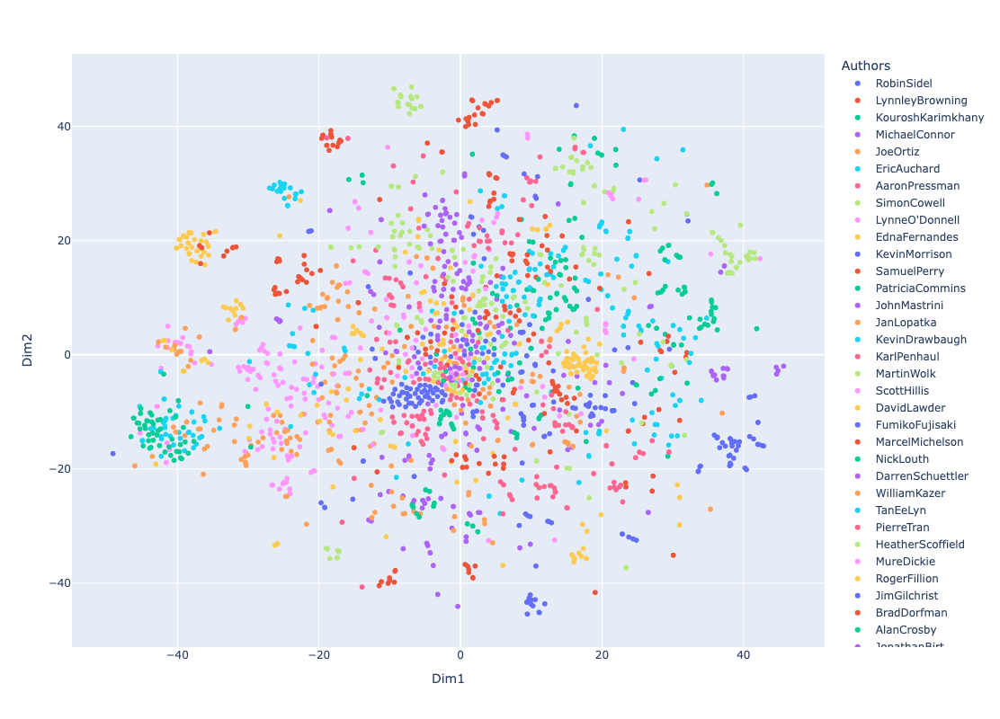

In [271]:
### Plotting
tsne_df = pd.DataFrame(data = tsne_results, columns = ['Dim1', 'Dim2'])
tsne_df['Authors'] = train_authors

fig = px.scatter(tsne_df, x='Dim1', y='Dim2', color = 'Authors', hover_data=['Authors'],  width=1000, height=800)
fig

In [272]:
# PCA and tSNA
pca = PCA(n_components=150)
reduced_data_pca = pca.fit_transform(train_dtm.toarray())

reduced_test_pca = pca.fit_transform(test_dtm.toarray())

tsne = TSNE(n_components=2, perplexity=80, verbose=1)
tsne_results = tsne.fit_transform(reduced_data_pca)

[t-SNE] Computing 241 nearest neighbors...
[t-SNE] Indexed 2500 samples in 0.001s...
[t-SNE] Computed neighbors for 2500 samples in 0.250s...
[t-SNE] Computed conditional probabilities for sample 1000 / 2500
[t-SNE] Computed conditional probabilities for sample 2000 / 2500
[t-SNE] Computed conditional probabilities for sample 2500 / 2500
[t-SNE] Mean sigma: 7.661974
[t-SNE] KL divergence after 250 iterations with early exaggeration: 66.686409
[t-SNE] KL divergence after 1000 iterations: 1.199412


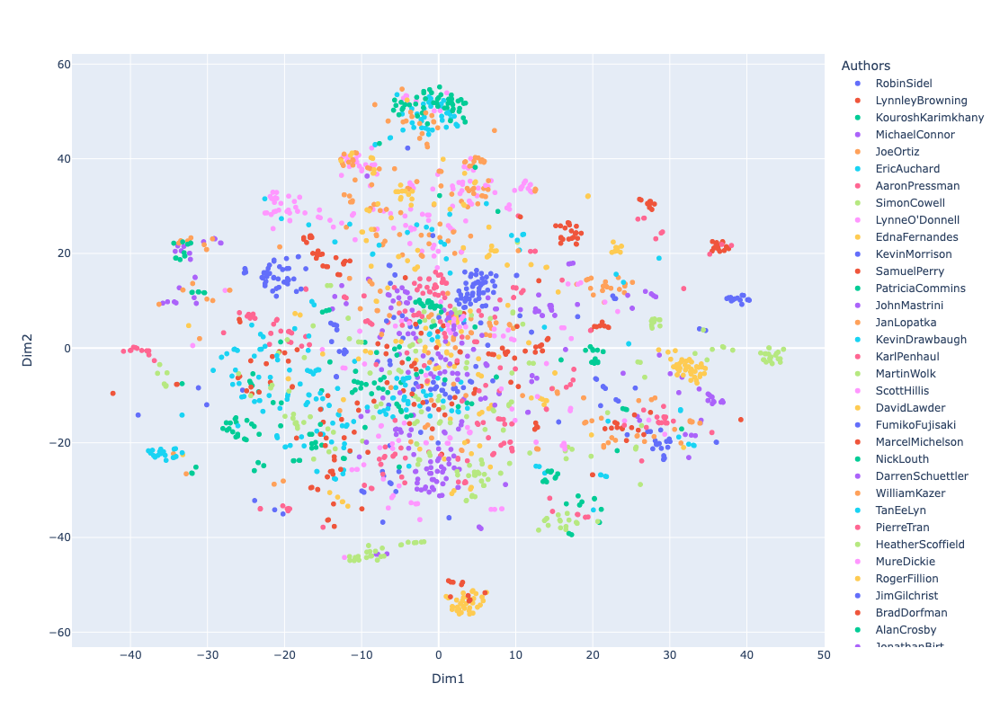

In [96]:
### Plotting
tsne_df = pd.DataFrame(data = tsne_results, columns = ['Dim1', 'Dim2'])
tsne_df['Authors'] = train_authors

fig = px.scatter(tsne_df, x='Dim1', y='Dim2', color = 'Authors', hover_data=['Authors'],  width=1000, height=800)
fig

## Results 1

From the two visualization plots, it seems that the information that defines authors is more or less preserved as the two tSNE's look almost identical. We can see that some authors write in a much more concise and defined way, where some others seem to have more variablity and less of a personal style. From here, we move on to predicting authors based on text. From these tSNE plots, we hypothesize that both PCA and using raw tokens data should result in similar predictions using the same model. We start with predicting using the reduced dimensionality.

## Approach 2
To run a neural net model, some data processing is needed beforehand. The first thing that needs to be done is converting author names (labels) into numerical data that can be predicted. Next, the x and y data needs to be turned into tensors so that they can be fed into the model. Next, the model was initialized and tweaked. The model includes one fully connected layer followed by an activation layer. The final layer outputs logits that will be converted into probabilities using softmax using the cross entropy loss criteria. This model uses AdaGrad with Momentum (Adam) optimizer to coverge quicker. The number of epochs was selected using trial and error until the loss approached zero. Finally, accruacy was assessed by finding total number of correct classifications. 

### Neural Net Creation

In [266]:
### Converting Dataframes to PyTorch 
label_encoder = LabelEncoder()
y_train_encoded = label_encoder.fit_transform(train_authors) # Encoding author names into numerical 
y_test_encoded = label_encoder.fit_transform(test_authors)

X_train_tensor = torch.tensor(reduced_data_pca, dtype=torch.float32)
y_train_tensor = torch.tensor(y_train_encoded, dtype=torch.long)

X_test_tensor = torch.tensor(reduced_test_pca, dtype=torch.float32)
y_test_tensor = torch.tensor(y_test_encoded, dtype=torch.long)

In [267]:
## Constructing a PyTorch Model
class SimpleNN(nn.Module):
    def __init__(self, input_features):
        super(SimpleNN, self).__init__()
        self.layer1 = nn.Linear(input_features, 128)
        self.layer2 = nn.Tanh()
        self.layer3 = nn.Linear(128, 256)
        self.layer4 = nn.Tanh()
        self.layer5 = nn.Linear(256, 512)
        self.layer6 = nn.Tanh()
        self.layer7 = nn.Linear(512, 512)
        self.layer8 = nn.Tanh()
        self.layer9 = nn.Linear(512, 128)
        self.layer10 = nn.Tanh()
        self.layer11 = nn.Linear(128, 64)
        self.layer12 = nn.ReLU()
        self.layer13 = nn.Linear(64, 50)
        
    
    def forward(self, x):
        x = self.layer1(x)
        x = self.layer2(x)
        x = self.layer3(x)
        x = self.layer4(x)
        x = self.layer5(x)
        x = self.layer6(x)
        x = self.layer7(x)
        x = self.layer8(x)
        x = self.layer9(x)

        
        x = self.layer10(x)
        x = self.layer11(x)
        x = self.layer12(x)
        x = self.layer13(x)
        return x

inputshape = X_train_tensor.shape[1]
model = SimpleNN(inputshape)
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr = 0.0001)

In [268]:
# Training loop
for epoch in range(500):
    model.train()
    epoch_loss = 0.0
    optimizer.zero_grad()      
    outputs = model(X_train_tensor)   
    loss = criterion(outputs, y_train_tensor)  
    loss.backward()           
    optimizer.step()    

    epoch_loss += loss.item()

    avg_loss = epoch_loss / len(train_loader)  # Average loss for the epoch
    print(f"Epoch [{epoch+1}/100], Loss: {avg_loss:.4f}")

Epoch [1/100], Loss: 0.0495
Epoch [2/100], Loss: 0.0495
Epoch [3/100], Loss: 0.0495
Epoch [4/100], Loss: 0.0494
Epoch [5/100], Loss: 0.0494
Epoch [6/100], Loss: 0.0493
Epoch [7/100], Loss: 0.0493
Epoch [8/100], Loss: 0.0493
Epoch [9/100], Loss: 0.0492
Epoch [10/100], Loss: 0.0492
Epoch [11/100], Loss: 0.0491
Epoch [12/100], Loss: 0.0491
Epoch [13/100], Loss: 0.0490
Epoch [14/100], Loss: 0.0490
Epoch [15/100], Loss: 0.0490
Epoch [16/100], Loss: 0.0489
Epoch [17/100], Loss: 0.0489
Epoch [18/100], Loss: 0.0488
Epoch [19/100], Loss: 0.0488
Epoch [20/100], Loss: 0.0487
Epoch [21/100], Loss: 0.0487
Epoch [22/100], Loss: 0.0486
Epoch [23/100], Loss: 0.0485
Epoch [24/100], Loss: 0.0485
Epoch [25/100], Loss: 0.0484
Epoch [26/100], Loss: 0.0484
Epoch [27/100], Loss: 0.0483
Epoch [28/100], Loss: 0.0482
Epoch [29/100], Loss: 0.0481
Epoch [30/100], Loss: 0.0481
Epoch [31/100], Loss: 0.0480
Epoch [32/100], Loss: 0.0479
Epoch [33/100], Loss: 0.0478
Epoch [34/100], Loss: 0.0477
Epoch [35/100], Loss: 0

In [269]:
# Accuracy Calculation
model.eval() 
correct = 0
total = y_test_tensor.size(0)  # Total number of samples in the test set

with torch.no_grad():
    outputs = model(X_test_tensor)  # Forward pass through the entire test set
    _, predicted = torch.max(outputs, 1)  # Get the index of the max log-probability (predicted class)
    correct += (predicted == y_test_tensor).sum().item()  # Compare with true labels and count correct predictions

accuracy = 100 * correct / total  # Calculate accuracy as a percentage
print(f'Accuracy on the test set: {accuracy:.2f}%')

Accuracy on the test set: 1.32%


## Results 2
I have 50 authors, if I randomly guessed an author I would have a 1/50 chance in guessing correctly, which is 2%. The accuracy of my model using dimensionality reduction through PCA performed worse than the baseline probability of guessing correctly. It's pretty clear the model performed poorly. This suggests that the dimension reduction may not have perserved enough information for a neural network to learn patterns about each author. Let's move on to training a neural network using the raw tokens 

## Approach 3
A neural network was trained the same way the previous one was, in this case the raw token data is used.

### Nueral Net Creation 2

In [256]:
X_train_tensor = torch.tensor(train_dtm.toarray(), dtype=torch.float32)
X_test_tensor = torch.tensor(test_dtm.toarray(), dtype=torch.float32)

In [257]:
## Constructing a PyTorch Model 2
class SimpleNN2(nn.Module):
    def __init__(self, input_features):
        super(SimpleNN2, self).__init__()
        self.layer1 = nn.Linear(input_features, 128)
        self.layer2 = nn.Tanh()
        self.layer3 = nn.Linear(128, 256)
        self.layer4 = nn.Tanh()
        self.layer5 = nn.Linear(256, 512)
        self.layer6 = nn.Tanh()
        self.layer7 = nn.Linear(512, 512)
        self.layer8 = nn.Tanh()
        self.layer9 = nn.Linear(512, 128)
        self.layer10 = nn.Tanh()
        self.layer11 = nn.Linear(128, 64)
        self.layer12 = nn.ReLU()
        self.layer13 = nn.Linear(64, 50)
        
    
    def forward(self, x):
        x = self.layer1(x)
        x = self.layer2(x)
        x = self.layer3(x)
        x = self.layer4(x)
        x = self.layer5(x)
        x = self.layer6(x)
        x = self.layer7(x)
        x = self.layer8(x)
        x = self.layer9(x)       

        
        x = self.layer10(x)
        x = self.layer11(x)
        x = self.layer12(x)
        x = self.layer13(x)
        return x

inputshape = X_train_tensor.shape[1]
model2 = SimpleNN2(inputshape)
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model2.parameters(), lr = 0.0001)

In [258]:
# Training loop
for epoch in range(500):
    model2.train()
    epoch_loss = 0.0
    optimizer.zero_grad()      
    outputs = model2(X_train_tensor)   
    loss = criterion(outputs, y_train_tensor)  
    loss.backward()           
    optimizer.step()    

    epoch_loss += loss.item()

    avg_loss = epoch_loss / len(X_train_tensor)  # Average loss for the epoch
    print(f"Epoch [{epoch+1}/100], Loss: {avg_loss:.4f}")

Epoch [1/100], Loss: 0.0016
Epoch [2/100], Loss: 0.0016
Epoch [3/100], Loss: 0.0016
Epoch [4/100], Loss: 0.0016
Epoch [5/100], Loss: 0.0016
Epoch [6/100], Loss: 0.0016
Epoch [7/100], Loss: 0.0016
Epoch [8/100], Loss: 0.0016
Epoch [9/100], Loss: 0.0016
Epoch [10/100], Loss: 0.0016
Epoch [11/100], Loss: 0.0016
Epoch [12/100], Loss: 0.0016
Epoch [13/100], Loss: 0.0016
Epoch [14/100], Loss: 0.0015
Epoch [15/100], Loss: 0.0015
Epoch [16/100], Loss: 0.0015
Epoch [17/100], Loss: 0.0015
Epoch [18/100], Loss: 0.0015
Epoch [19/100], Loss: 0.0015
Epoch [20/100], Loss: 0.0015
Epoch [21/100], Loss: 0.0015
Epoch [22/100], Loss: 0.0015
Epoch [23/100], Loss: 0.0015
Epoch [24/100], Loss: 0.0015
Epoch [25/100], Loss: 0.0015
Epoch [26/100], Loss: 0.0015
Epoch [27/100], Loss: 0.0015
Epoch [28/100], Loss: 0.0015
Epoch [29/100], Loss: 0.0015
Epoch [30/100], Loss: 0.0015
Epoch [31/100], Loss: 0.0015
Epoch [32/100], Loss: 0.0015
Epoch [33/100], Loss: 0.0015
Epoch [34/100], Loss: 0.0015
Epoch [35/100], Loss: 0

In [259]:
# Accuracy Calculation
model2.eval() 
correct = 0
total = y_test_tensor.size(0)

with torch.no_grad():
    outputs = model2(X_test_tensor)
    _, predicted = torch.max(outputs, 1)
    correct += (predicted == y_test_tensor).sum().item()

accuracy = 100 * correct / total 
print(f'Accuracy on the test set: {accuracy:.2f}%')

Accuracy on the test set: 49.40%


## Results 3
Using just the vectorized tokens of the authors increased accuracy more than 50 fold! This clearly suggests that PCA did not preserve enough information about each author's style to correctly attribute a text to that author. Although 50% accuracy is not ideal, I suspect that not many humans can retain enough information about 50 author's styles to correctly predict who wrote an article 50% of the time. Therefore, we are satisfied with the results of this model.

## Conclusion
Our question was **can the author of an article be predicted given only the text of the article? Does reducing dimensionality of the data extracted from the text affect the accuracy of predicting authors?**
Our group found that although tSNE visualizations are not heavily affected by reduction in dimensionality, neural networks are absolutely sensitive to reduction in dimensionality when the only available inputs are the texts of the authors. Prediction accuracy was increased from 1% to 50% when the raw vectorized tokens were used as apposed to the principal components. Our group recognizes that this may not always be the case. If a sentiment analysis, topic analysis, writing style analysis, or other forms of analyses were used to extract new data from the texts then dimensionality reduction may have a different affect. In conclusion, you may be able to predict around 50% accurately using a neural network if no extra anlysis is done on a piece of text from these 50 authors. 

# 8. Associate Rule Mining

In [347]:
# cite: used this from a data anlytics class where they taugh us association analysis in python to avoid errors
import warnings

warnings.filterwarnings(
    action='ignore',
    category=DeprecationWarning,
    message="`should_run_async` will not call `transform_cell` automatically in the future.*"
)

In [348]:
# load data and split the single column into items
df = pd.read_fwf('groceries (1).txt', header=None)
df = df[0].str.split(',')
df.head()

0    [citrus fruit, semi-finished bread, margarine,...
1                     [tropical fruit, yogurt, coffee]
2                                         [whole milk]
3     [pip fruit, yogurt, cream cheese , meat spreads]
4    [other vegetables, whole milk, condensed milk,...
Name: 0, dtype: object

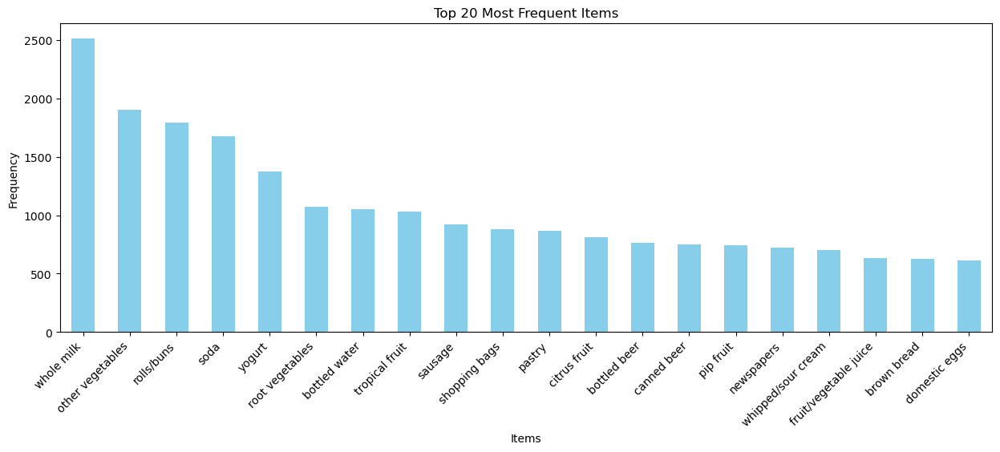

In [349]:
# 20 most common items

# flatten the list of items and count the frequency of each
all_items = [item.strip() for sublist in df for item in sublist]
item_counts = pd.Series(all_items).value_counts().head(20)

# plot a histogram
plt.figure(figsize=(15, 5))
item_counts.plot(kind='bar', color='skyblue')
plt.title('Top 20 Most Frequent Items')
plt.xlabel('Items')
plt.ylabel('Frequency')
plt.xticks(rotation=45, ha='right')
plt.show()

In [350]:
# how many unique items are there
unique_items = len(set(all_items))

# also how many transactions are there
num_transactions = df.shape[0]

print(f"Number of unique items: {unique_items}")
print(f"Number of transactions: {num_transactions}")

Number of unique items: 398
Number of transactions: 9835


In [351]:
# Convert the data to one hot encoded transactions
te = TransactionEncoder()
te_ary = te.fit(df).transform(df)
df_encoded = pd.DataFrame(te_ary, columns=te.columns_)
df_encoded.head()

,,Instant f,Instant fo,Instant food,Instant food produ,Instant food products,UHT-milk,abrasi,abrasive cleaner,artif. sweetener,...,whipped/sour cream,whisky,whit,white,white b,white bread,white wine,whole milk,yogurt,zwieback
0,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
1,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,True,False
2,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,True,False,False
3,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,True,False
4,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,True,False,False


In [352]:
# create frequent itemsets

# using min_support of 20
min_support = 20 / len(df_encoded)
frequent_itemsets = apriori(df_encoded, min_support=min_support, use_colnames=True)

# last 15 frequent itemsets
frequent_itemsets.tail(15)

,support,itemsets
3065,0.005694,"(root vegetables, yogurt, tropical fruit, whol..."
3066,0.003457,"(whipped/sour cream, root vegetables, yogurt, ..."
3067,0.003152,"(sausage, whole milk, yogurt, tropical fruit)"
3068,0.002542,"(whole milk, yogurt, tropical fruit, soda)"
3069,0.004169,"(whipped/sour cream, whole milk, yogurt, tropi..."
3070,0.002339,"(butter, whole milk, tropical fruit, other veg..."
3071,0.003152,"(whole milk, citrus fruit, root vegetables, tr..."
3072,0.002339,"(whole milk, citrus fruit, root vegetables, ot..."
3073,0.002440,"(whole milk, citrus fruit, tropical fruit, oth..."
3074,0.002440,"(whole milk, root vegetables, pip fruit, tropi..."


In [353]:
# generate strong rules - confidence level of 0.5
rules = association_rules(frequent_itemsets, metric="confidence", min_threshold=0.5)

rules

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction,zhangs_metric
0,(),(other vegetables),0.002847,0.193493,0.002237,0.785714,4.060694,0.001686,3.763701,0.755889
1,(),(whole milk),0.002847,0.255516,0.002135,0.750000,2.935237,0.001408,2.977936,0.661194
2,(baking powder),(whole milk),0.016268,0.255516,0.008134,0.500000,1.956825,0.003977,1.488968,0.497054
3,(cereals),(whole milk),0.005389,0.255516,0.003355,0.622642,2.436800,0.001978,1.972883,0.592820
4,(jam),(whole milk),0.005186,0.255516,0.002745,0.529412,2.071932,0.001420,1.582028,0.520055
...,...,...,...,...,...,...,...,...,...,...
617,"(yogurt, root vegetables, whipped/sour cream, ...",(other vegetables),0.003457,0.193493,0.002135,0.617647,3.192096,0.001466,2.109327,0.689108
618,"(yogurt, root vegetables, whipped/sour cream, ...",(whole milk),0.003254,0.255516,0.002135,0.656250,2.568332,0.001304,2.165772,0.612636
619,"(whipped/sour cream, tropical fruit, whole mil...",(yogurt),0.004270,0.139502,0.002237,0.523810,3.754859,0.001641,1.807046,0.736825
620,"(yogurt, whipped/sour cream, tropical fruit, w...",(other vegetables),0.004169,0.193493,0.002237,0.536585,2.773157,0.001430,1.740358,0.642077


Analysis this far:
So far, the analysis of grocery shopping baskets has revealed several interesting insights. The dataset contains 398 unique items across 9,835 transactions, with items like "whole milk" and "other vegetables" being among the most frequent. The apriori algorithm was used to identify frequent itemsets, with a minimum support threshold calculated from the data. The generated association rules, filtered for confidence levels above 0.5 and lift values greater than 3, indicate strong relationships between certain grocery items. Notably, items such as "whipped/sour cream" and "whole milk" frequently co-occur with other vegetables, suggesting common purchase patterns among customers.

In [354]:
# creating rules with different metrics
# lift > 3
# leverage > 0.004
# conviction > 1.2

# lift
rules_lift = association_rules(frequent_itemsets, metric="lift", min_threshold=3)
rules_lift

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction,zhangs_metric
0,(),(other vegetables),0.002847,0.193493,0.002237,0.785714,4.060694,0.001686,3.763701,0.755889
1,(other vegetables),(),0.193493,0.002847,0.002237,0.011561,4.060694,0.001686,1.008816,0.934569
2,(hamburger meat),(Instant food products),0.033249,0.007321,0.002745,0.082569,11.278670,0.002502,1.082020,0.942680
3,(Instant food products),(hamburger meat),0.007321,0.033249,0.002745,0.375000,11.278670,0.002502,1.546802,0.918058
4,(sugar),(baking powder),0.032740,0.016268,0.002847,0.086957,5.345109,0.002314,1.077420,0.840429
...,...,...,...,...,...,...,...,...,...,...
2795,"(yogurt, tropical fruit)","(whipped/sour cream, whole milk, other vegetab...",0.029283,0.014438,0.002237,0.076389,5.290737,0.001814,1.067074,0.835455
2796,"(yogurt, other vegetables)","(whipped/sour cream, tropical fruit, whole milk)",0.043416,0.007728,0.002237,0.051522,6.667386,0.001901,1.046174,0.888596
2797,(whipped/sour cream),"(yogurt, tropical fruit, whole milk, other veg...",0.071479,0.007626,0.002237,0.031294,4.103746,0.001692,1.024433,0.814543
2798,(tropical fruit),"(yogurt, whipped/sour cream, whole milk, other...",0.104931,0.005389,0.002237,0.021318,3.955865,0.001671,1.016276,0.834808


In [355]:
# leverage
rules_leverage = association_rules(frequent_itemsets, metric="leverage", min_threshold=0.004)
rules_leverage

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction,zhangs_metric
0,(beef),(citrus fruit),0.052466,0.082766,0.008439,0.160853,1.943472,0.004097,1.093055,0.512337
1,(citrus fruit),(beef),0.082766,0.052466,0.008439,0.101966,1.943472,0.004097,1.055120,0.529262
2,(beef),(other vegetables),0.052466,0.193493,0.019725,0.375969,1.943066,0.009574,1.292416,0.512224
3,(other vegetables),(beef),0.193493,0.052466,0.019725,0.101944,1.943066,0.009574,1.055095,0.601792
4,(beef),(pork),0.052466,0.057651,0.007626,0.145349,2.521174,0.004601,1.102612,0.636768
...,...,...,...,...,...,...,...,...,...,...
715,"(yogurt, whole milk)","(root vegetables, tropical fruit)",0.056024,0.021047,0.005694,0.101633,4.828814,0.004515,1.089703,0.839969
716,"(whole milk, tropical fruit)","(root vegetables, yogurt)",0.042298,0.025826,0.005694,0.134615,5.212371,0.004602,1.125712,0.843841
717,(root vegetables),"(whole milk, yogurt, tropical fruit)",0.108998,0.015150,0.005694,0.052239,3.448112,0.004043,1.039133,0.796841
718,(yogurt),"(root vegetables, tropical fruit, whole milk)",0.139502,0.011998,0.005694,0.040816,3.401937,0.004020,1.030045,0.820513


In [356]:
# conviction
rules_conviction = association_rules(frequent_itemsets, metric="conviction", min_threshold=1.2)
rules_conviction

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction,zhangs_metric
0,(),(other vegetables),0.002847,0.193493,0.002237,0.785714,4.060694,0.001686,3.763701,0.755889
1,(),(whole milk),0.002847,0.255516,0.002135,0.750000,2.935237,0.001408,2.977936,0.661194
2,(Instant food products),(hamburger meat),0.007321,0.033249,0.002745,0.375000,11.278670,0.002502,1.546802,0.918058
3,(baking powder),(other vegetables),0.016268,0.193493,0.006202,0.381250,1.970359,0.003055,1.303446,0.500623
4,(baking powder),(whole milk),0.016268,0.255516,0.008134,0.500000,1.956825,0.003977,1.488968,0.497054
...,...,...,...,...,...,...,...,...,...,...
2331,"(whipped/sour cream, tropical fruit, whole milk)","(yogurt, other vegetables)",0.007728,0.043416,0.002237,0.289474,6.667386,0.001901,1.346303,0.856636
2332,"(yogurt, whipped/sour cream, whole milk)","(tropical fruit, other vegetables)",0.010676,0.035892,0.002237,0.209524,5.837583,0.001854,1.219654,0.837639
2333,"(whipped/sour cream, tropical fruit, other veg...","(yogurt, whole milk)",0.007626,0.056024,0.002237,0.293333,5.235814,0.001810,1.335815,0.815224
2334,"(yogurt, whipped/sour cream, tropical fruit)","(whole milk, other vegetables)",0.005999,0.074835,0.002237,0.372881,4.982728,0.001788,1.475263,0.804131


By applying different metrics—lift, leverage, and conviction—to the association rules derived from the grocery dataset, we can gain deeper insights into the relationships between items in shopping baskets.

**Lift:** Rules with a lift greater than 3 indicate that the items in the antecedent and consequent are more likely to occur together than would be expected by chance. For example, "Instant food products" and "hamburger meat" co-occur far more frequently than random chance would suggest, highlighting a strong association between these items.

**Leverage:** Leverage measures the difference between the observed co-occurrence of items and what would be expected if the items were independent. High leverage values suggest that the co-occurrence of items (like "beef" and "citrus fruit") is significantly higher than what we would expect by chance, indicating a meaningful relationship that could be of interest to retailers.

**Conviction:** Conviction indicates the dependency between items. A higher conviction means that the presence of the antecedent strongly suggests the presence of the consequent. For instance, the association between "baking powder" and "whole milk" shows a relatively high conviction, indicating that customers buying baking powder are significantly likely to buy whole milk. (probably because if they are buying baking powder, they will bake, and for most baking recipes you need milk)

In [357]:
# maximal frequent itemsets are those that are frequent and do not have any frequent supersets, lets find those
# sort frequent itemsets by length (number of items) in descending order
frequent_itemsets['length'] = frequent_itemsets['itemsets'].apply(lambda x: len(x))
frequent_itemsets = frequent_itemsets.sort_values(by='length', ascending=False).reset_index(drop=True)

maximal = []

# iterate through the sorted itemsets
for i, row in frequent_itemsets.iterrows():
    item_set = row['itemsets']
    is_maximal = True

    # check only the itemsets that come before the current itemset in the list
    for j in range(i):
        if item_set.issubset(frequent_itemsets.iloc[j]['itemsets']):
            is_maximal = False
            break

    if is_maximal:
        maximal.append((item_set, row['support']))

# convert the result to a DataFrame for easier viewing
maximal_itemsets = pd.DataFrame(maximal, columns=['itemsets', 'support'])

# display the results
print(f"Total number of maximal frequent itemsets: {len(maximal_itemsets)}")
print(maximal_itemsets)

Total number of maximal frequent itemsets: 1980
                                               itemsets   support
0     (whipped/sour cream, whole milk, tropical frui...  0.002237
1     (whipped/sour cream, whole milk, root vegetabl...  0.002135
2     (whole milk, root vegetables, tropical fruit, ...  0.003559
3     (whole milk, pip fruit, tropical fruit, other ...  0.002339
4     (whole milk, root vegetables, pip fruit, other...  0.002339
...                                                 ...       ...
1975                                        (nut snack)  0.002745
1976                                     (meat spreads)  0.004067
1977                                   (pudding powder)  0.002034
1978                                              (rum)  0.004372
1979                                  (potato products)  0.002745

[1980 rows x 2 columns]


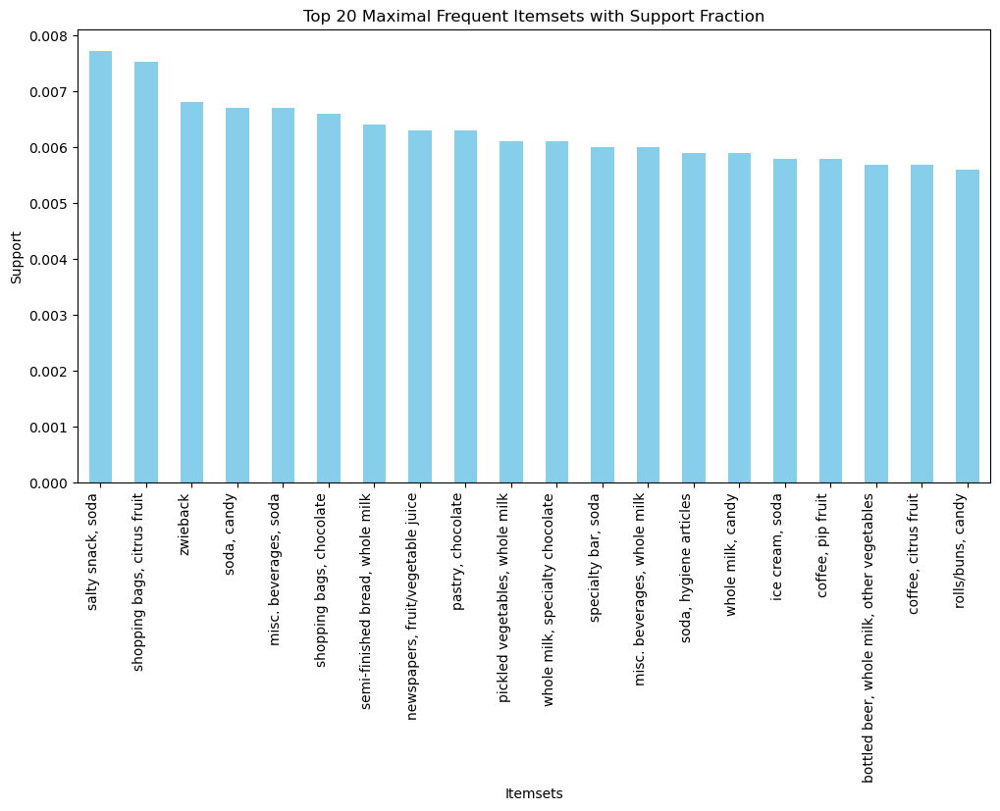

Total number of maximal frequent itemsets (including the ones shown): 1980


In [358]:
# plot maximal frequent itemsets

# the plot was too big so I'll only do the ones wiht the top 20 most support
top_20_maximal_itemsets = maximal_itemsets.sort_values(by='support', ascending=False).head(20)

plt.figure(figsize=(12, 6))
top_20_maximal_itemsets['support'].plot(kind='bar', color='skyblue')
plt.title('Top 20 Maximal Frequent Itemsets with Support Fraction')
plt.xlabel('Itemsets')
plt.ylabel('Support')
plt.xticks(range(len(top_20_maximal_itemsets)),
           top_20_maximal_itemsets['itemsets'].apply(lambda x: ', '.join(list(x))),
           rotation=90, ha='right')
plt.show()

maximal_count = len(maximal_itemsets)

# count of all maximal frequent itemsets
print(f"Total number of maximal frequent itemsets (including the ones shown): {maximal_count}")

The bar plot highlights the top 20 maximal frequent itemsets with the highest support, meaning these combinations of items occur most frequently together in customer shopping baskets. These itemsets do not have any supersets that are frequent (none of the 1980 maximal freuqent itemsets do), indicating they are the most significant standalone combinations of items. Notable combinations include "soda & salty snacks," "whole milk & candy," and "chocolate & shopping bags," reflecting common pairings that customers tend to buy together. The high support for these itemsets suggests that these combinations are widely popular among customers, making them prime candidates for targeted marketing strategies, promotions, and optimized product placements within stores.

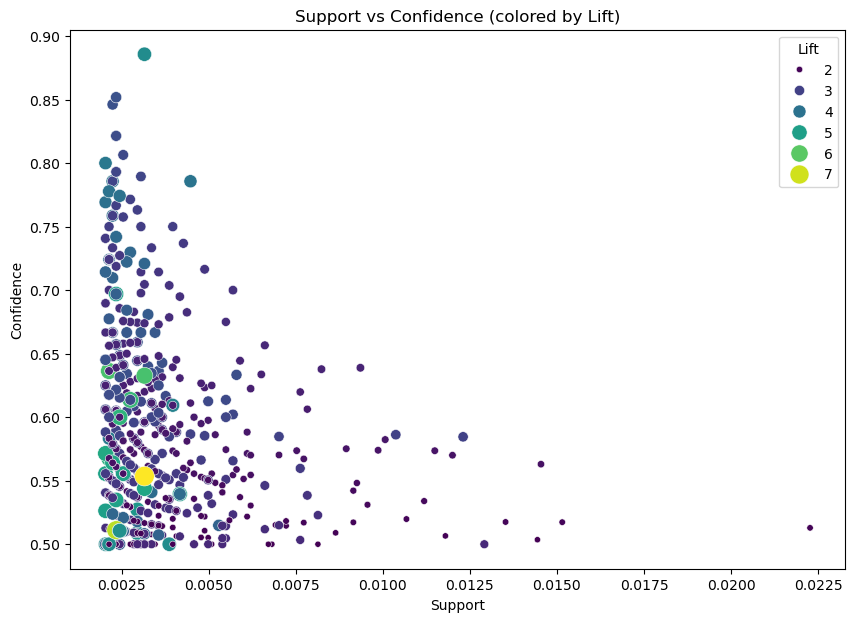

In [359]:
# scatter plot for Support vs Confidence colored by Lift
plt.figure(figsize=(10, 7))
sns.scatterplot(x='support', y='confidence', size='lift', sizes=(20, 200), hue='lift', data=rules, palette='viridis')
plt.title('Support vs Confidence (colored by Lift)')
plt.xlabel('Support')
plt.ylabel('Confidence')
plt.legend(loc='best', title='Lift')
plt.show()

This visualization shows that most of the association rules with higher confidence levels tend to have lower support, indicating that while these item pairs are frequently bought together by certain customers, they don't occur as often across the entire dataset. The color-coding by lift reveals that some of these low-support, high-confidence rules have very strong associations, meaning the occurrence of the consequent item is significantly more likely when the antecedent is purchased. (It's a tradeoff)

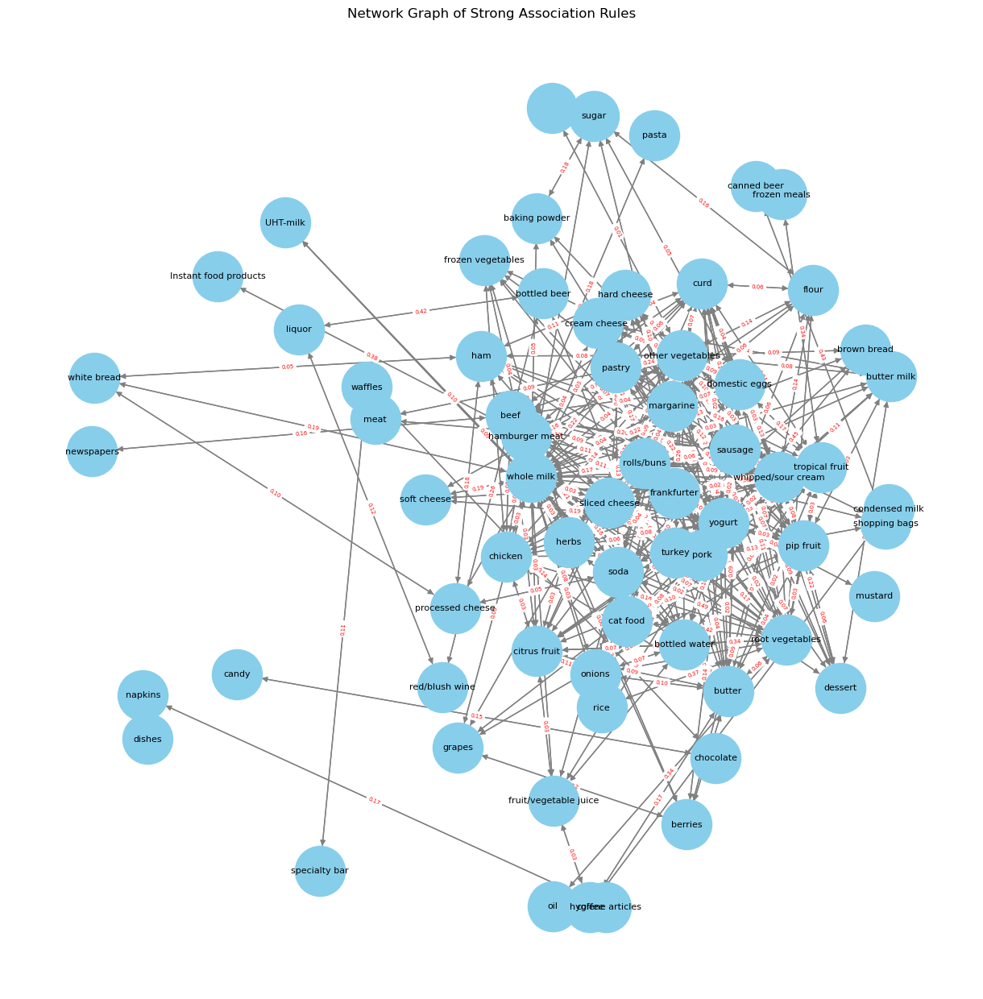

In [360]:
# create a network graph for association rules with high lift
G = nx.DiGraph()

# add nodes and edges
for _, rule in rules_lift.iterrows():
    for antecedent in rule['antecedents']:
        for consequent in rule['consequents']:
            G.add_edge(antecedent, consequent, weight=rule['confidence'])

# plot the graph
plt.figure(figsize=(12, 12))
pos = nx.spring_layout(G, k=0.5, seed=42)
nx.draw(G, pos, with_labels=True, node_size=2000, node_color='skyblue', font_size=8, edge_color='gray')
nx.draw_networkx_edge_labels(G, pos, edge_labels={(i, j): f"{d['weight']:.2f}" for i, j, d in G.edges(data=True)}, font_color='red',font_size=5)
plt.title('Network Graph of Strong Association Rules')
plt.show()

The network graph provides a visualization of the relationships between frequently co-occurring items. The thickness of the edges and the confidence values indicate strong associations between certain pairs, such as "whole milk" with "yogurt," "butter," and "other vegetables." These associations suggest common shopping patterns where certain staple items are purchased together, possibly indicating meal planning or regular grocery stock-ups.

The insights derived from this analysis can be leveraged to improve marketing strategies and product placement in stores:

*Cross-Promotions and Bundling:*

Use the strong associations between items such as "whole milk" and "yogurt," or "soda" and "salty snacks," to create targeted promotions or bundled deals. For example, offering discounts on yogurt when customers purchase whole milk can encourage additional sales.

*Optimizing Store Layout:*

The identified frequent item pairs should be placed near each other in stores to make shopping more convenient for customers, potentially increasing basket size. For example, placing chocolate near the checkout line alongside shopping bags could encourage impulse purchases (this is something a lot of stores already do).

*Personalized Marketing Campaigns:*

The data can be used to develop personalized marketing campaigns targeting customers based on their shopping history. For example, customers who frequently purchase "soda" and "salty snacks" could receive targeted ads or coupons for these items or for the items that are frequently purchased alongside those.

By implementing these strategies, businesses can potentially increase sales, improve customer satisfaction, and create a more personalized shopping experience.

# 9. Image Classification with Neural Networks

### Set-Up 
Loading in the datasets and splitting into 80% training and 20% testing

In [118]:
data_transform = transforms.Compose([
    transforms.Resize((64, 64)),
    transforms.ToTensor()
])
dataset = ImageFolder(root='/Users/ramzikattan/Library/CloudStorage/OneDrive-TheUniversityofTexasatAustin/2. Summer/STA S380P2/STA380-master/data/EuroSAT_RGB', transform=data_transform)
train_size = int(0.8 * len(dataset))
test_size = len(dataset) - train_size
train_dataset, test_dataset = random_split(dataset, [train_size, test_size])

train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=32, shuffle=False)

### Explore the Data

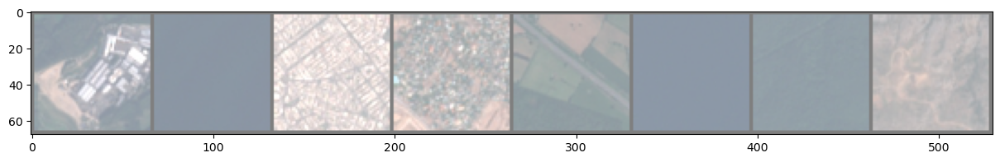

Labels: Industrial, SeaLake, Residential, Residential, Highway, SeaLake, Forest, HerbaceousVegetation


In [119]:
def dispimage(img):
    plt.figure(figsize = (15, 15))
    img = img / 2 + 0.5
    npimg = img.numpy()
    plt.imshow(np.transpose(npimg, (1, 2, 0)))
    plt.show()

# Get a batch of training images and display them
dataiter = iter(train_loader)
images, labels = next(dataiter)
# Display the first 16 images in the batch
dispimage(torchvision.utils.make_grid(images[:8]))

# Map labels to class names
class_names = dataset.classes
label_names = [class_names[labels[j]] for j in range(8)]

# Print the class names of the first 16 images
print('Labels:', ', '.join(label_names))

### Create the Neural Network

In [122]:
class Net(nn.Module):
    def __init__(self):
        super(Net, self).__init__()
        self.conv1 = nn.Conv2d(3, 32, 3, 1)
        self.conv2 = nn.Conv2d(32, 64, 3, 1) 
        self.conv3 = nn.Conv2d(64, 128, 3, 1)
        self.fc1 = nn.Linear(29*29*128, 128) 
        self.fc2 = nn.Linear(128, 10) 

    def forward(self, x):
        x = self.conv1(x)
        x = F.relu(x)
        x = self.conv2(x)
        x = F.relu(x)
        x = self.conv3(x)
        x = F.relu(x)
        x = F.max_pool2d(x, 2)
        x = torch.flatten(x, 1)
        x = self.fc1(x)
        x = F.relu(x)
        x = self.fc2(x)
        return F.log_softmax(x, dim=1)

net = Net()
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(net.parameters())

### Training

In [124]:
# Number of training epochs
num_epochs = 5

testiter = iter(test_loader)
# Main training loop
for epoch in range(num_epochs):
    running_loss = 0.0
    net.train()
    for i, data in enumerate(train_loader, 0):
        inputs, labels = data

        # Zero the parameter gradients
        optimizer.zero_grad()

        # Forward, backward, and optimize
        outputs = net(inputs)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

        running_loss += loss.item()

    # Print average loss for the epoch
    print(f"Epoch {epoch+1}, Loss: {running_loss / (i+1)}")


print('Finished Training')


Epoch 1, Loss: 1.0524839842761005
Epoch 2, Loss: 0.6264582781217717
Epoch 3, Loss: 0.4259656849503517
Epoch 4, Loss: 0.31575053876196896
Epoch 5, Loss: 0.2105834762144972
Finished Training


### Testing the Model

In [125]:
def show_images(images, labels, preds, title):
    "Display images with their labels and predictions."
    plt.figure(figsize=(15, 15))
    for i in range(len(images)):
        plt.subplot(4, 4, i + 1)
        img = images[i] / 2 + 0.5
        npimg = img.numpy()
        plt.imshow(np.transpose(npimg, (1, 2, 0)))
        plt.title(f"True: {labels[i]}\nPred: {preds[i]}")
        plt.axis('off')
    plt.suptitle(title)
    plt.show()

Test Accuracy: 82.81%


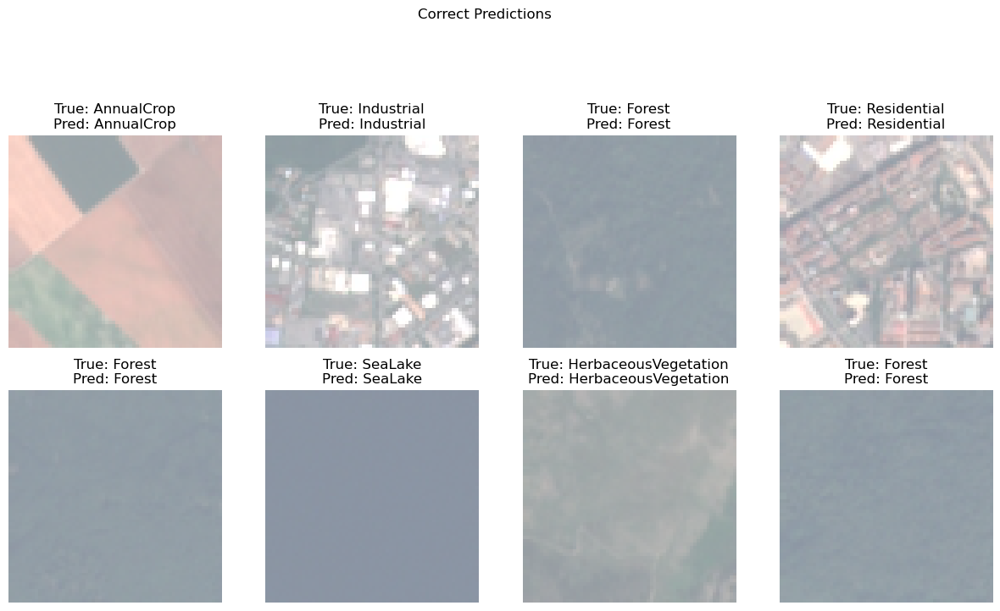

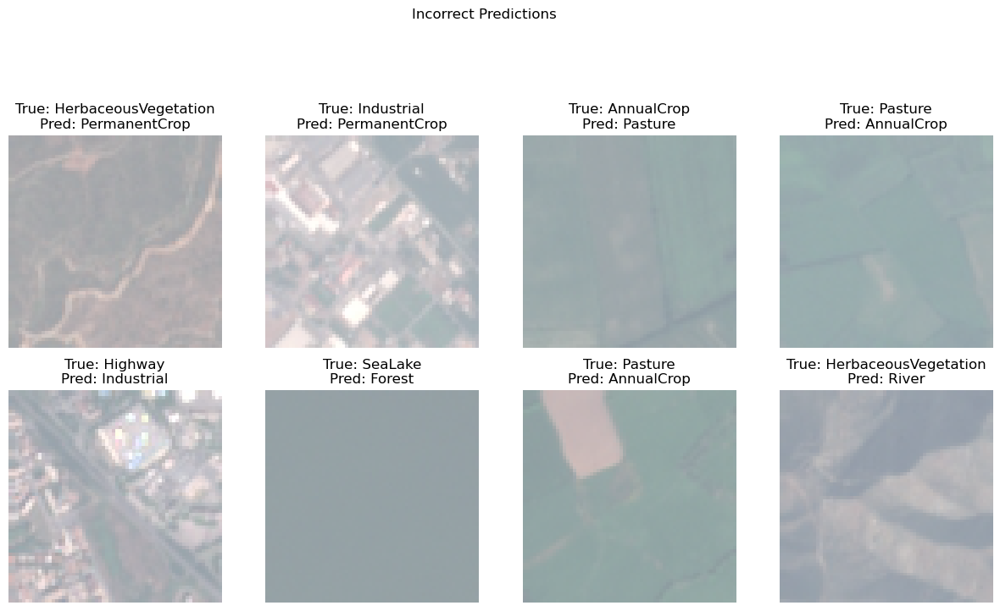

In [126]:
# Get Test Accuracy
def test_accuracy(model, test_loader, classes, num_examples):  
    model.eval() 
    correct = 0
    total = 0

    correct_images = []
    correct_labels = []
    correct_preds = []

    incorrect_images = []
    incorrect_labels = []
    incorrect_preds = []

    with torch.no_grad():  
        for images, labels in test_loader:
            outputs = model(images)
            _, predicted = torch.max(outputs.data, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()

            # Save correct and incorrect predictions
            for i in range(len(labels)):
                if predicted[i] == labels[i] and len(correct_images) < num_examples:
                    correct_images.append(images[i])
                    correct_labels.append(classes[labels[i]])
                    correct_preds.append(classes[predicted[i]])
                elif predicted[i] != labels[i] and len(incorrect_images) < num_examples:
                    incorrect_images.append(images[i])
                    incorrect_labels.append(classes[labels[i]])
                    incorrect_preds.append(classes[predicted[i]])

            if len(correct_images) >= num_examples and len(incorrect_images) >= num_examples:
                break

    accuracy = correct / total * 100
    print(f'Test Accuracy: {accuracy:.2f}%')

    # correct predictions
    if correct_images:
        show_images(correct_images, correct_labels, correct_preds, "Correct Predictions")

    # incorrect predictions
    if incorrect_images:
        show_images(incorrect_images, incorrect_labels, incorrect_preds, "Incorrect Predictions")

test_accuracy(net, test_loader, dataset.classes, 8)

### Confusion Matrix

In [127]:
def collect_labels_and_predictions(model, data_loader):
    """Helper function to collect actual and predicted labels."""
    model.eval()
    all_labels = []
    all_predictions = []
    with torch.no_grad():
        for images, labels in data_loader:
            outputs = model(images)
            _, predicted = torch.max(outputs.data, 1)
            all_labels.extend(labels.cpu().numpy())
            all_predictions.extend(predicted.cpu().numpy())
    
    return all_labels, all_predictions

In [128]:
def plot_confusion_matrix(labels, predictions, classes):
    """Helper function to plot a confusion matrix."""
    # Compute the confusion matrix
    cm = confusion_matrix(labels, predictions)
    
    # Convert the confusion matrix to a DataFrame for better visualization
    cm_df = pd.DataFrame(cm, index=classes, columns=classes)
    
    # Plot the confusion matrix
    plt.figure(figsize=(8, 6))
    sns.heatmap(cm_df, annot=True, fmt='d', cmap='Blues')
    plt.title('Confusion Matrix')
    plt.ylabel('Actual')
    plt.xlabel('Predicted')
    plt.show()

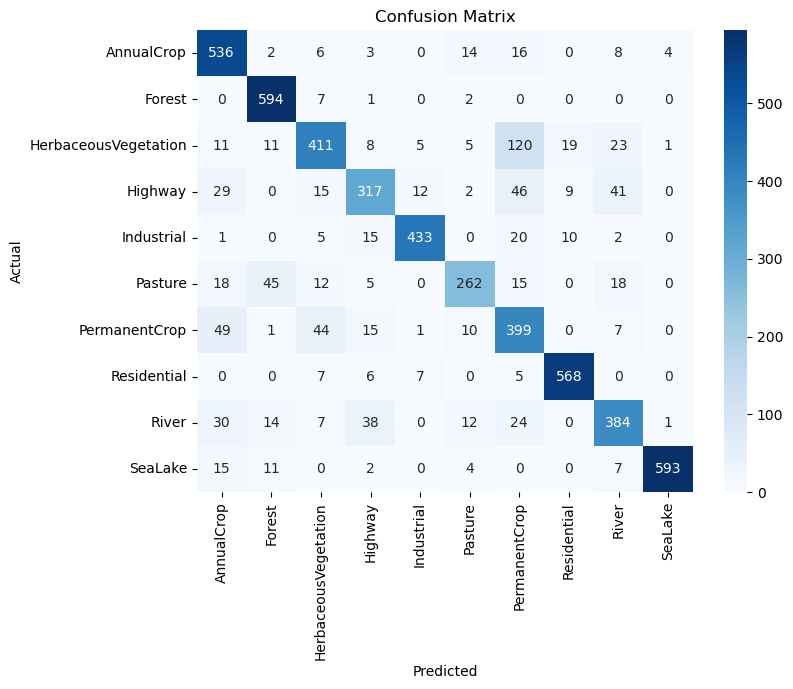

In [129]:
labels, predictions = collect_labels_and_predictions(net, test_loader)

# Plot the correlation matrix for the actual and predicted labels
plot_confusion_matrix(labels, predictions, dataset.classes)

With an accuracy of 82.81%, the model is not perfect. We can see from the confusion matrix that the model struggles greatly to predict highways as it confuses highways with Rivers, Permanent Crops, and Herbaceous Vegetation. The model also struggles between the difference Permanent Crops and Herbaceous Vegetation. The model could be made better if we created a validation set and trained the model until the validation set loss stops decreasing, igniting an early stoppage.